# PROJET ANALYSE DE DONNEES 


Importation des librairies et des jeux de données

In [419]:
import plotly
import sys
import pandas as pd
path='data/'  # si les données sont déjà dans le répertoire courant
loading = pd.read_csv(path+'velibLoading.csv', sep = " ")
loading.head()

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758


In [420]:
Coord = pd.read_csv(path+'velibCoord.csv', sep = " ")
Coord.head()

,longitude,latitude,bonus,names
1,2.377389,48.886300,0,EURYALE DEHAYNIN
2,2.317591,48.890020,0,LEMERCIER
3,2.330447,48.850297,0,MEZIERES RENNES
4,2.271396,48.833734,0,FARMAN
5,2.366897,48.845887,0,QUAI DE LA RAPEE


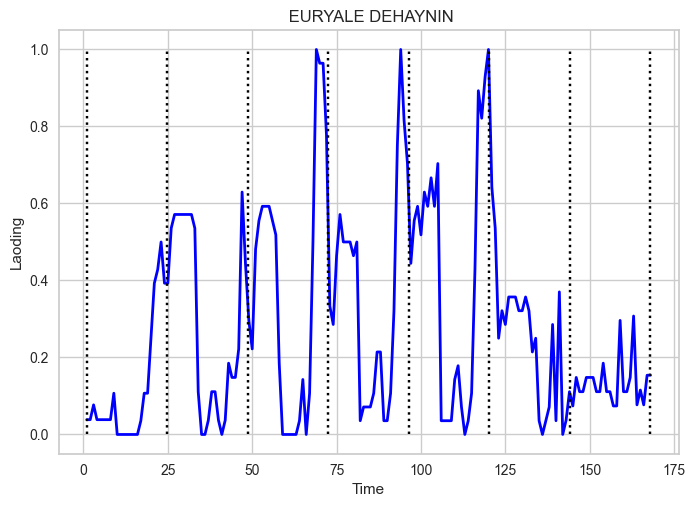

In [421]:
# Plot the loading of the first station
import matplotlib as plt
from pylab import * 
import numpy as np

p = loading.columns.size
Time = np.linspace(1, p, p)
plot(Time, loading.transpose()[1], linewidth = 2, color = 'blue')
xlabel('Time'); ylabel('Laoding'); title(Coord.names[1])
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
show()

# Analyse Descriptive

On va parcourir les 16 premières stations pour afficher leur chargement.


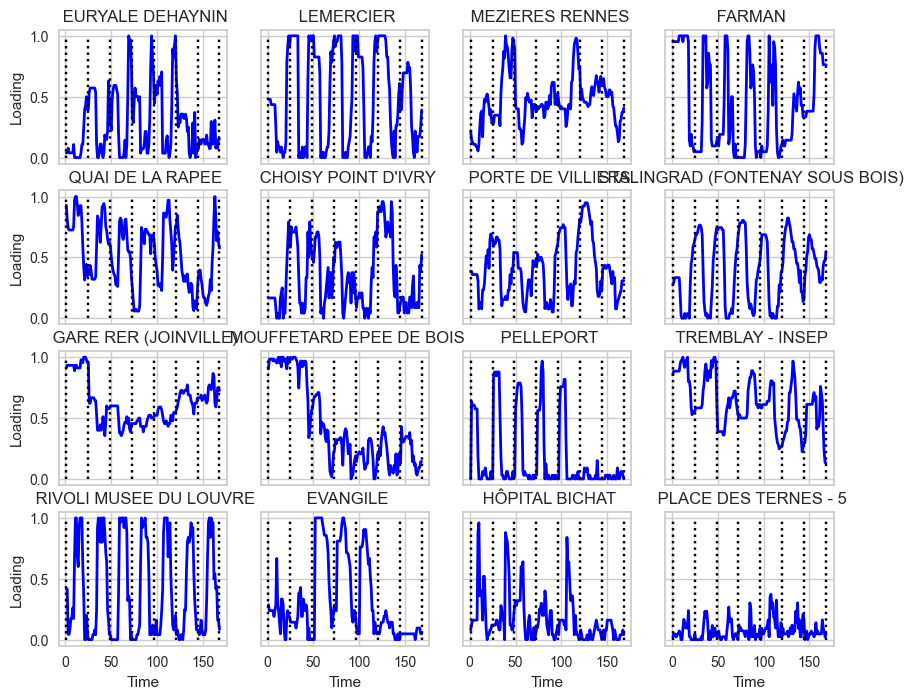

In [422]:
fig, axs = subplots(4, 4, figsize=(10,8))
p = loading.columns.size
Time = np.linspace(1, p, p)

for i in range(4):
    for j in range(4):
        axs[i,j].plot(Time, loading.transpose()[4*i+j+1], linewidth = 2, color = 'blue')
        axs[i,j].set_title(Coord.names[4*i+j+1])
        axs[i,j].vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
        
        
for ax in axs.flat:
    ax.set(xlabel='Time', ylabel='Loading')  
for ax in axs.flat:
    ax.label_outer()

        
show()

Boxplot des chargements pour chaque heure.


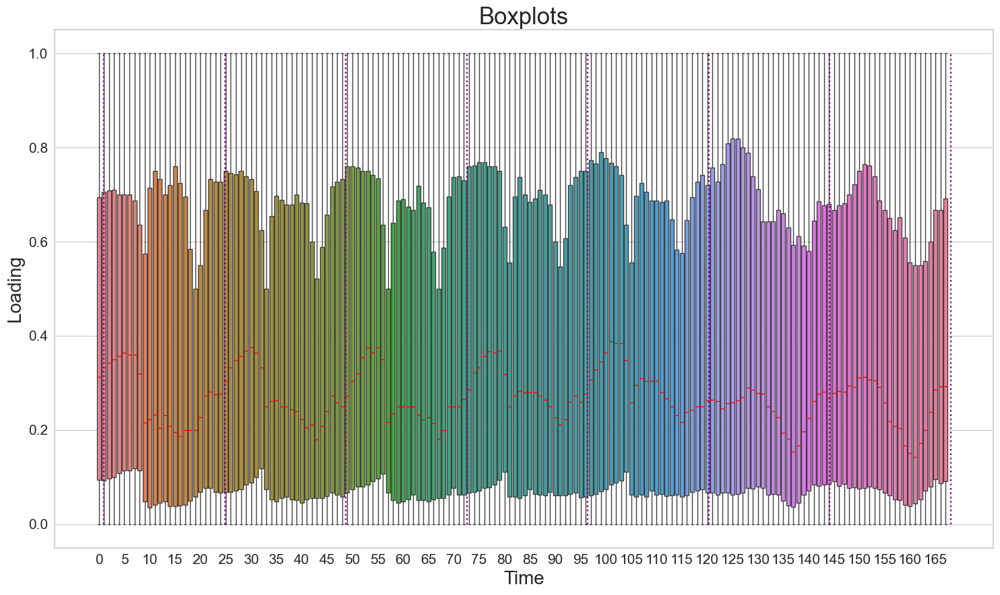

In [423]:
import seaborn as sns
%matplotlib inline

figure(figsize = (15,9))

ar=np.array(loading)
bp = sns.boxplot(data=ar, medianprops={"color": "red"},)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)

plt.xlabel('Time',fontsize = 20)
plt.ylabel('Loading', fontsize = 20)
plt.title("Boxplots", fontsize = 25)
plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.show()

On voit que les jours de la semaine ont des comportements similaires entre eux. On voit aussi que les deux jours de week-end se ressemblent.


## Moyenne de chargement par heure pour chaque jour de la semaine

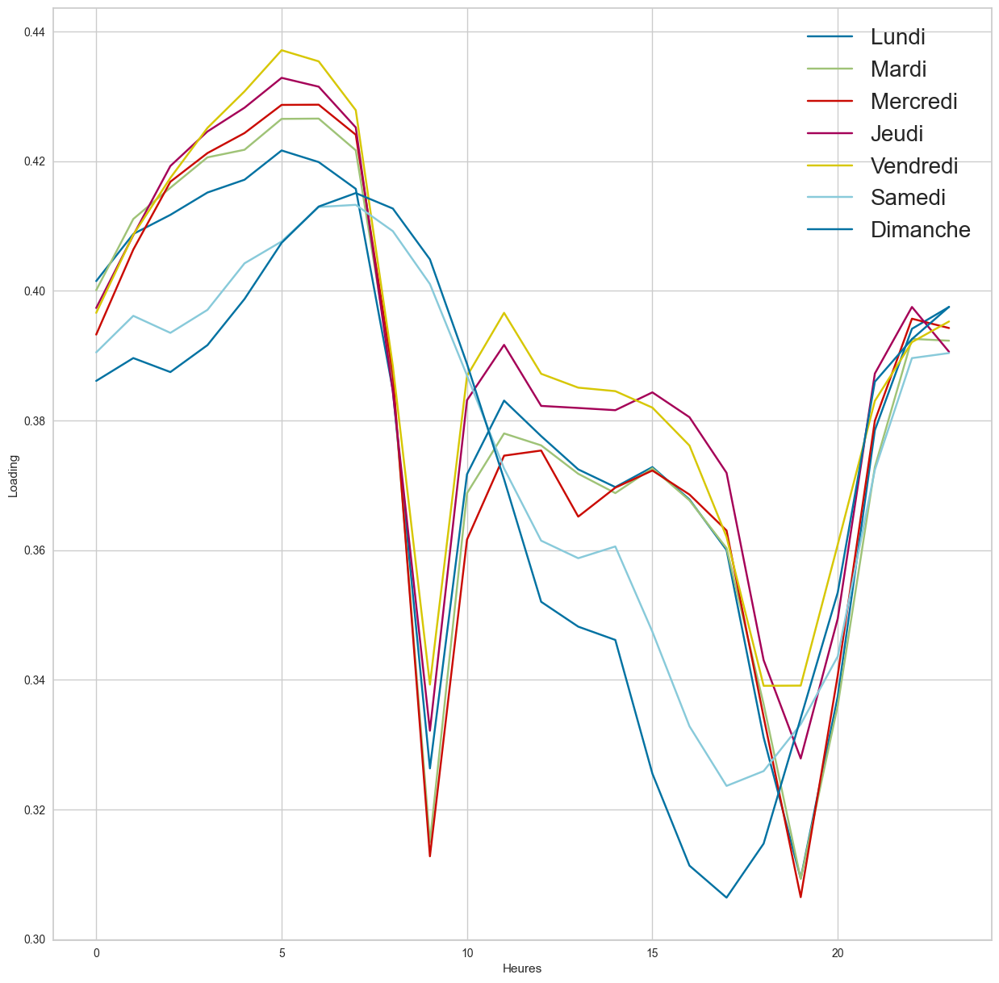

In [424]:

figure(figsize = (15,15))

MoyHeures=np.sum(loading,axis=0)/1189
MoyHeures=np.array(MoyHeures)
#print(MoyHeures)
jours = ["Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche"]
MoyHeuresPJours=np.reshape(MoyHeures,(24,7), order='F')
plot(MoyHeuresPJours)
xlabel("Heures")
ylabel("Loading")
legend(jours, prop={'size' : 20})
show()

On voit des résultats similaires pour samedi et dimanche, qui ont une tendance différente des autres jours de la semaine, ce qui confirme ce qui est vu sur le boxplot.


## Représentation des moyennes de chargement pour chaque heure (6h,12h,23h)

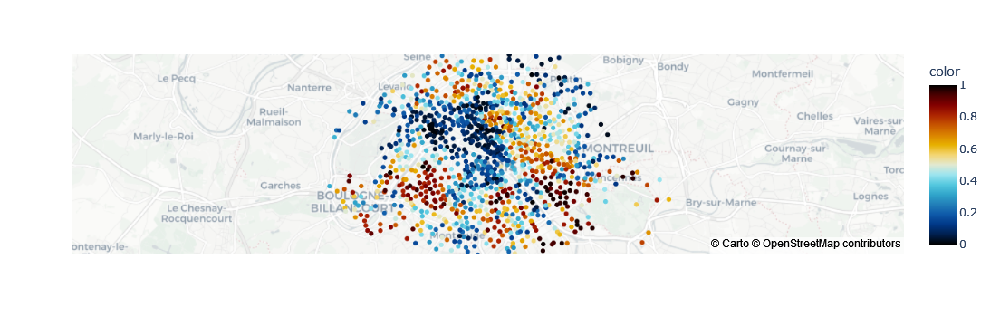

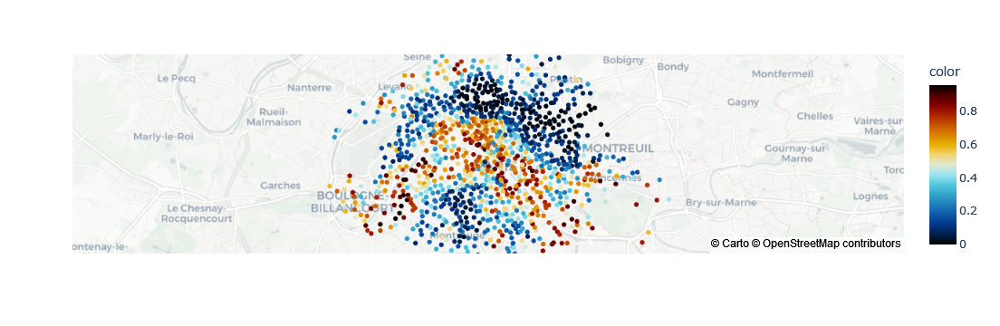

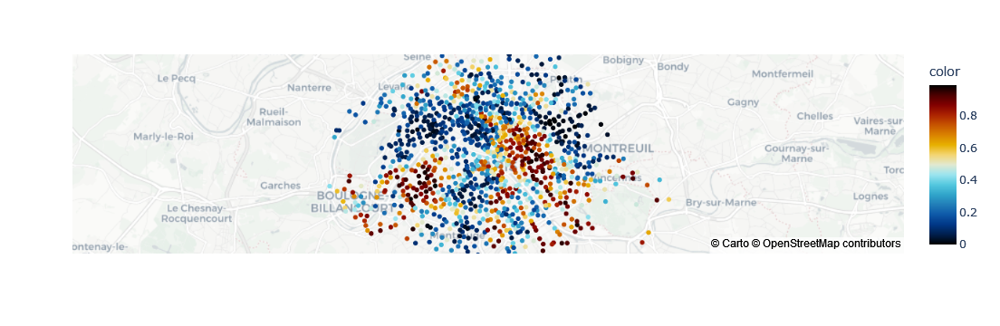

In [425]:
import plotly.express as px


Position=np.array(Coord)[:,0:2]


a6 = np.arange(6,168,24, dtype=int)
data6h=np.mean(np.array(loading)[:,a6],axis=1)




fig6 = px.scatter_mapbox(data6h ,Position[:,1],Position[:,0], color = data6h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig6.show()

a12 = np.arange(12,168,24, dtype=int)
data12h=np.mean(np.array(loading)[:,a12],axis=1)




fig12 = px.scatter_mapbox(data12h ,Position[:,1],Position[:,0], color = data12h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig12.show()

a23 = np.arange(23,168,24, dtype=int)
data23h=np.mean(np.array(loading)[:,a23],axis=1)



fig23 = px.scatter_mapbox(data23h ,Position[:,1],Position[:,0], color = data23h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig23.show()

## Représentation des stations en fonction de leur relief


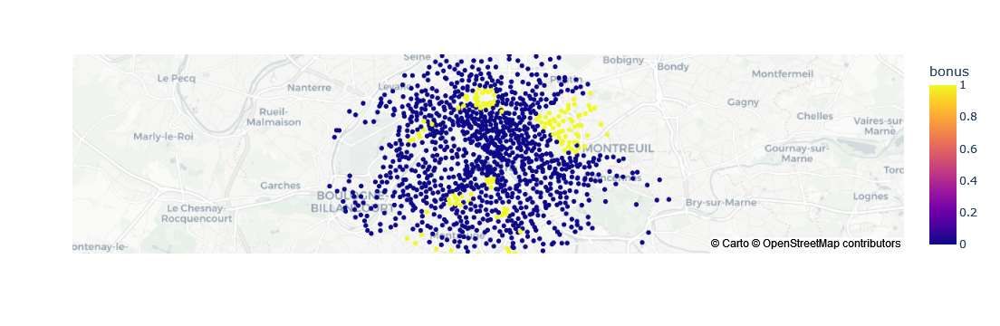

In [426]:
bonus=np.array(Coord)[:,2]
#help(px.scatter_mapbox)
data24h=np.mean(np.array(loading),axis=1)
figbonus = px.scatter_mapbox(Coord ,'latitude','longitude', color_discrete_sequence=[ 'blue', 'red'], color='bonus',size_max=15, zoom=10, mapbox_style="carto-positron",)
figbonus.show()


On reconnaît ici les collines parisiennes (représentées en jaune sur la carte).


## Histogramme des données de chargement

In [427]:
loading.head()
loading.describe()
x=np.array(loading)

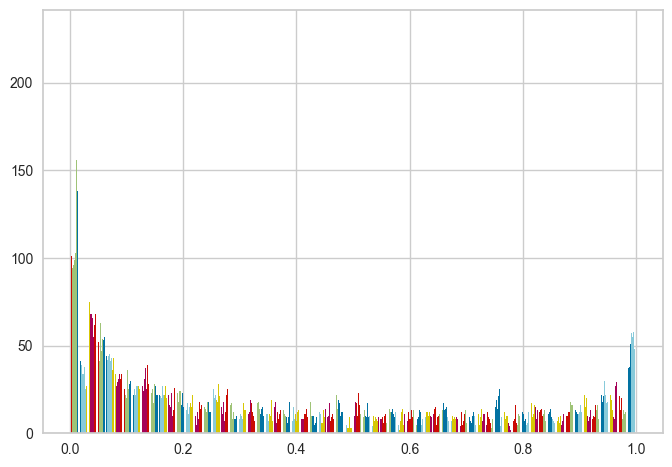

In [428]:
plt.hist(x, bins=64)
plt.show()

On a beaucoup de stations très peu chargées (à une heure de donnée), difficile à interpréter.

Rq: On a 1189 stations pour 168h de prélèvement de chargement donc cohérent d'avoir un nombre de 25000 en max.

 

## Matrice de corrélation

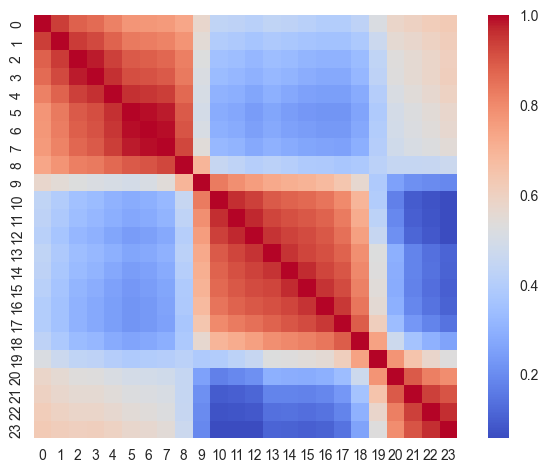

In [429]:
correlation = np.corrcoef(x.T)

# Sélectionner un sous-ensemble de la matrice de corrélation
correlation_subset = correlation[0:24, 0:24]

# Créer le heatmap avec seaborn sans annotations
sns.heatmap(correlation_subset, cmap="coolwarm", annot=False, square=True, cbar=True)

# Afficher le heatmap
plt.show()

In [430]:
#Autre façon mais résultats bizarre pour matrice de corrélation (différents de R : plutôt laisser celui du dessus)

# from pyensae.graphhelper import Corrplot

# c = Corrplot(x[:,0:24])
# c.plot(figsize=(20,20))

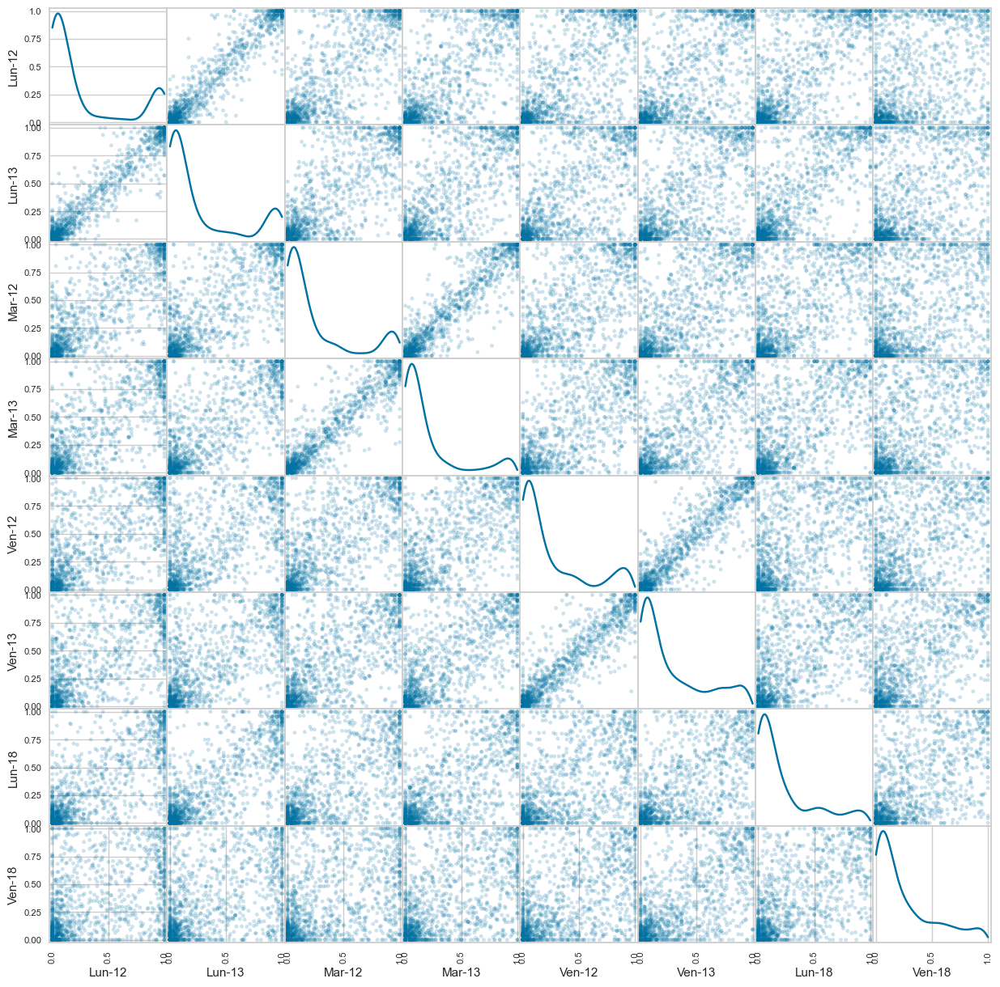

In [431]:
from pandas.plotting import scatter_matrix
scatter_matrix(loading[["Lun-12","Lun-13","Mar-12","Mar-13","Ven-12","Ven-13","Lun-18","Ven-18"]], alpha=0.2, 
               figsize=(15, 15), diagonal='kde')
plt.show()

Ce graphique confirme les corrélations que l'on a pu voir sur le graphe au dessus. Par exemple Lundi-12h et Lundi 13h sont très corrélés (on observe une droite). Pour mardi et vendredi il y a aussi une corrélation entre 12 et 13h.



## Comportements stations sur colline ou non


### Sur colline


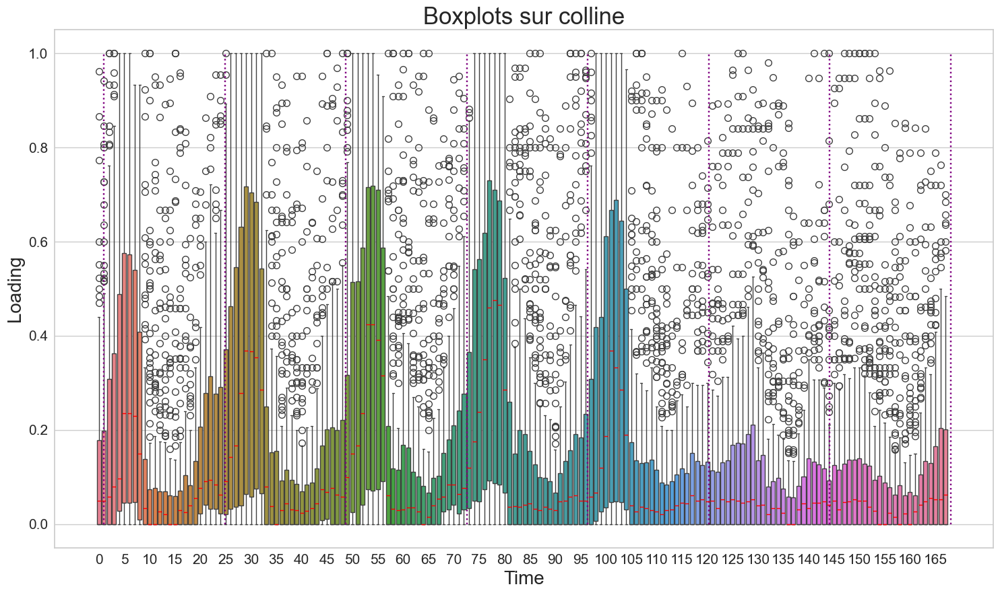

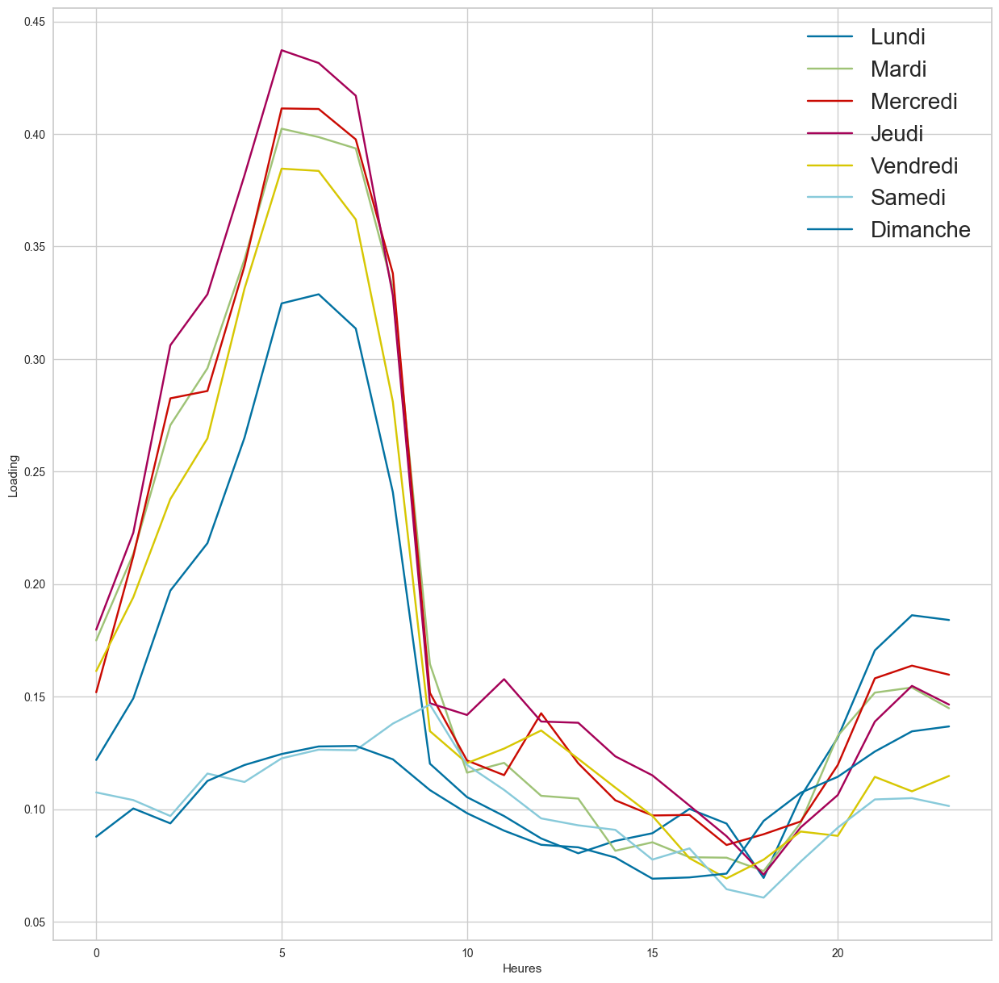

In [432]:

figure(figsize = (15,9))

load_hill = loading[Coord.bonus==1].copy()

ar_hill=np.array(load_hill)
bp = sns.boxplot(data=ar_hill, medianprops={"color": "red"},)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)

plt.xlabel('Time',fontsize = 20)
plt.ylabel('Loading', fontsize = 20)
plt.title("Boxplots sur colline", fontsize = 25)
plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.show()


figure(figsize = (15,15))

MoyHeures=np.sum(load_hill,axis=0)/len(load_hill)
MoyHeures=np.array(MoyHeures)
#print(MoyHeures)
jours = ["Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche"]
MoyHeuresPJours=np.reshape(MoyHeures,(24,7), order='F')
plot(MoyHeuresPJours)
xlabel("Heures")
ylabel("Loading")
legend(jours, prop={'size' : 20})
show()

Pour les stations en hauteur, les week-ends il n'y a pas beaucoup de vélos chargés. En semaine, il y a un fort écart entre le matin et l'après-midi.


### Sur stations sans relief : 

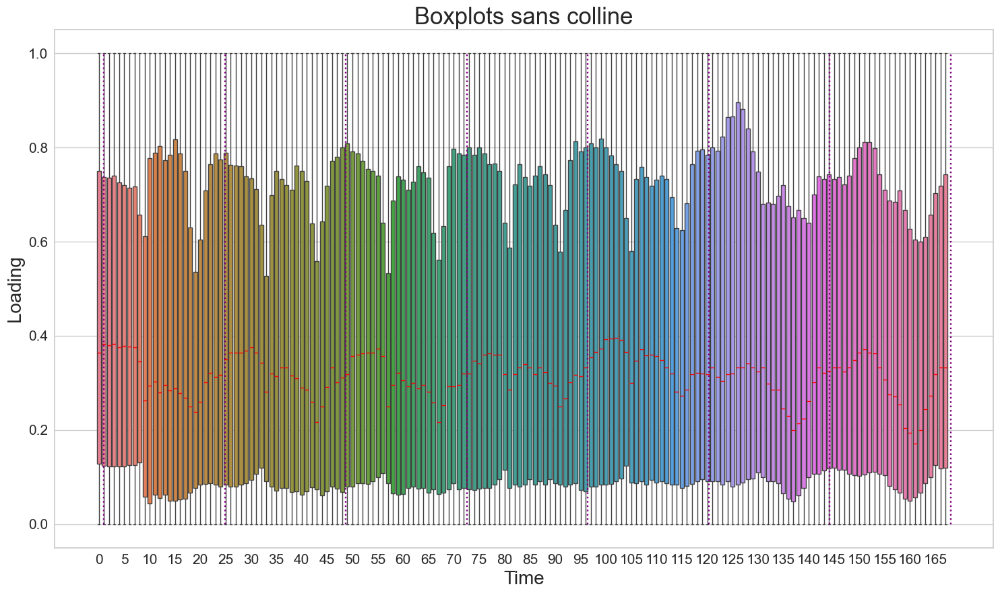

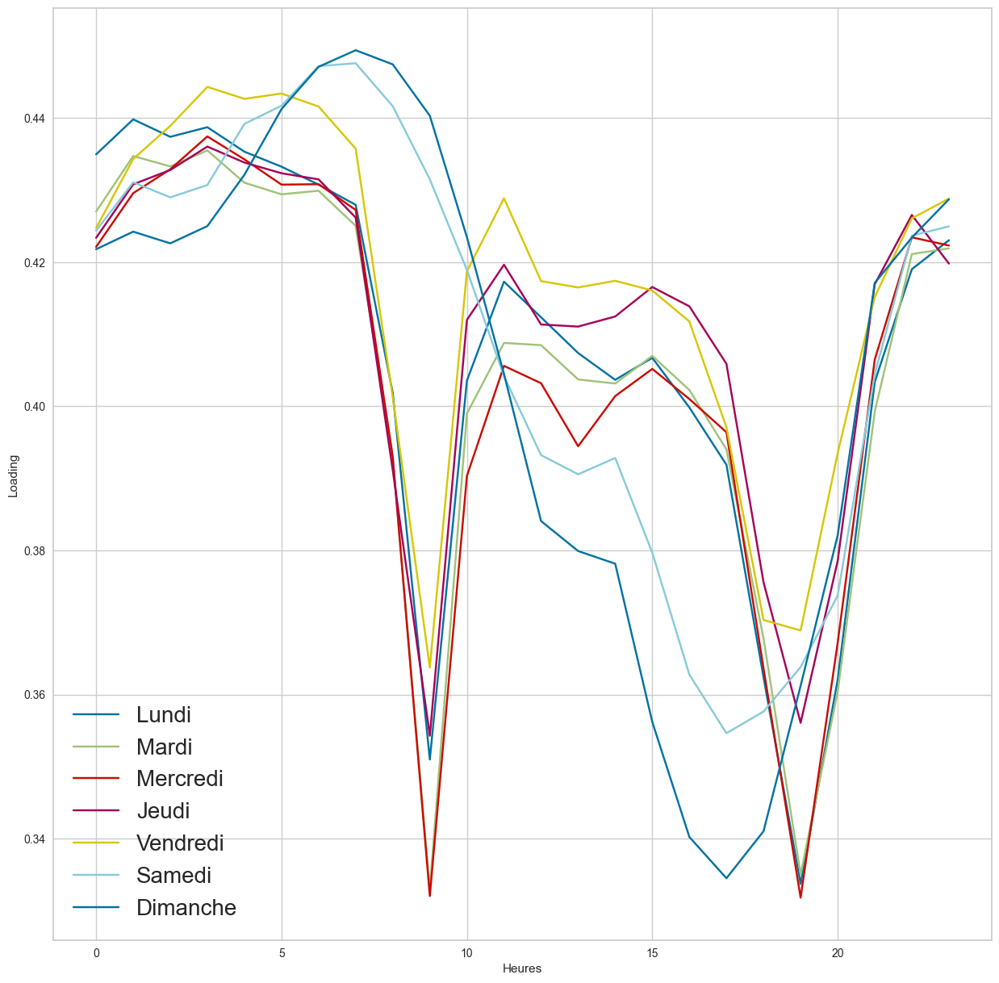

In [433]:

figure(figsize = (15,9))

load_no_hill = loading[Coord.bonus==0].copy()

ar_no_hill=np.array(load_no_hill)
bp = sns.boxplot(data=ar_no_hill, medianprops={"color": "red"},)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)

plt.xlabel('Time',fontsize = 20)
plt.ylabel('Loading', fontsize = 20)
plt.title("Boxplots sans colline", fontsize = 25)
plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.show()


figure(figsize = (15,15))

MoyHeures=np.sum(load_no_hill,axis=0)/len(load_no_hill)
MoyHeures=np.array(MoyHeures)
#print(MoyHeures)
jours = ["Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche"]
MoyHeuresPJours=np.reshape(MoyHeures,(24,7), order='F')
plot(MoyHeuresPJours)
xlabel("Heures")
ylabel("Loading")
legend(jours, prop={'size' : 20})
show()

On voit que le comportement pour les stations plates se rapproche plus du comportement moyen, ce qui est normal car la majorité des stations ne sont pas sur des collines. 
De plus on remarque une différence moins flagrante entre la semaine et le weekend pour les stations plates.


# PCA

On a un jeu de données pour loading a 168 variables donc 168 dimensions. On veut essayer de voir si on peut se ramener à des données de plus faibles dimensions. Pour cela on va faire une Analyse en Composantes Principales.


## Implémentation de la PCA

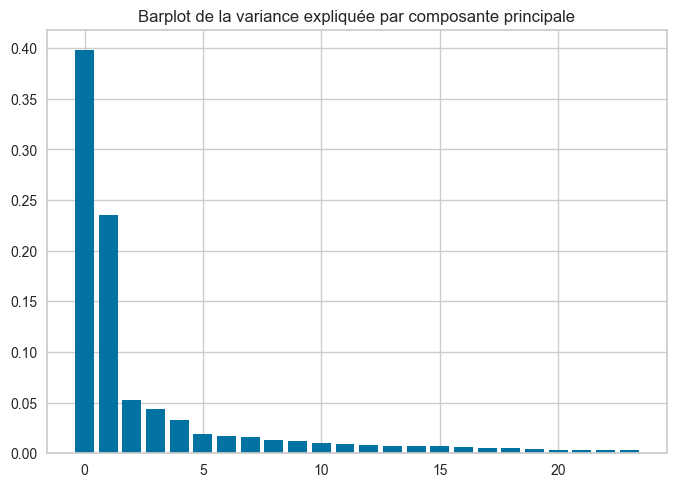

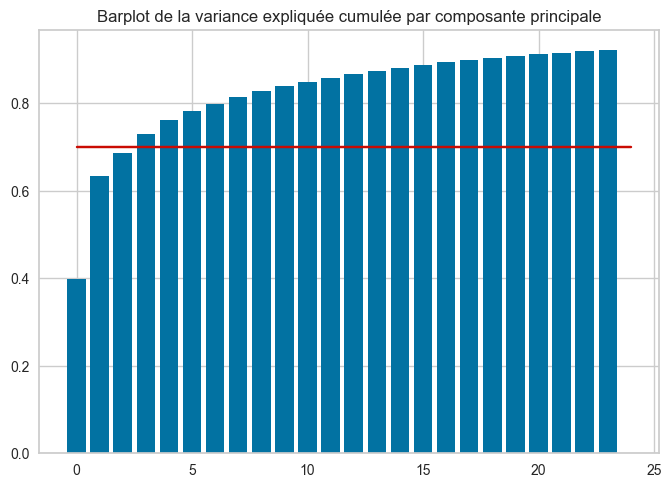

In [434]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import scale

pca = PCA()
#On estime nos composantes principales
pcaR = pd.DataFrame(scale(loading), columns = loading.columns)
C = pca.fit(pcaR).transform(pcaR)
## Décroissance de la variance expliquée
plt.bar(np.arange(len(pca.explained_variance_ratio_))[0:24],height=pca.explained_variance_ratio_[0:24])
plt.title("Barplot de la variance expliquée par composante principale")
plt.show()
plt.bar(np.arange(len(pca.explained_variance_ratio_))[0:24],height=np.cumsum(pca.explained_variance_ratio_[0:24]))
plt.plot(range(0,25), np.ones(25)*0.7, c='r')
plt.title("Barplot de la variance expliquée cumulée par composante principale")
plt.show()

Pour expliquer au moins 70% de variance, il faut garder 4 composantes principales.


### Boxplots des projections des données sur les composantes principales

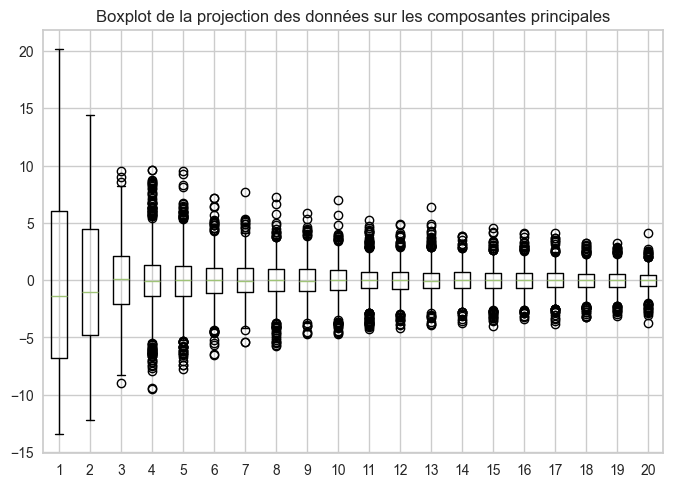

In [435]:
plt.boxplot(C[:,0:20])
plt.title("Boxplot de la projection des données sur les composantes principales")
plt.show()

Ce graphique montre une grande variance pour les 3/4 premières composantes principales, ce qui confirme le choix de garder 4 composantes.
On voit par exemple que les individus ont en moyenne -1 pour la coordonnée sur la 1ère composante principale.

## Projection des variables sur le plan d'ACP

### Selon la 1ère et la 2ème composantes principales


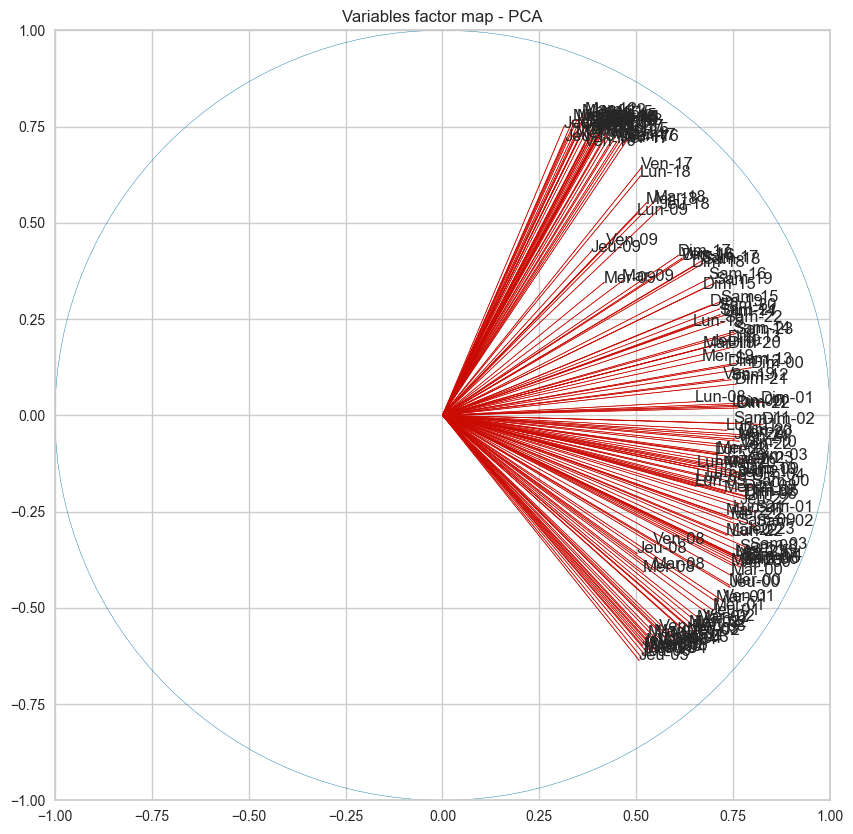

In [436]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()


On voit que pour les dimensions 1 et 2, toutes les flèches sont proches du cercle : les variables sont donc relativement bien expliquées par les composantes principales

### Selon la 1ère et la 3ème composantes principales


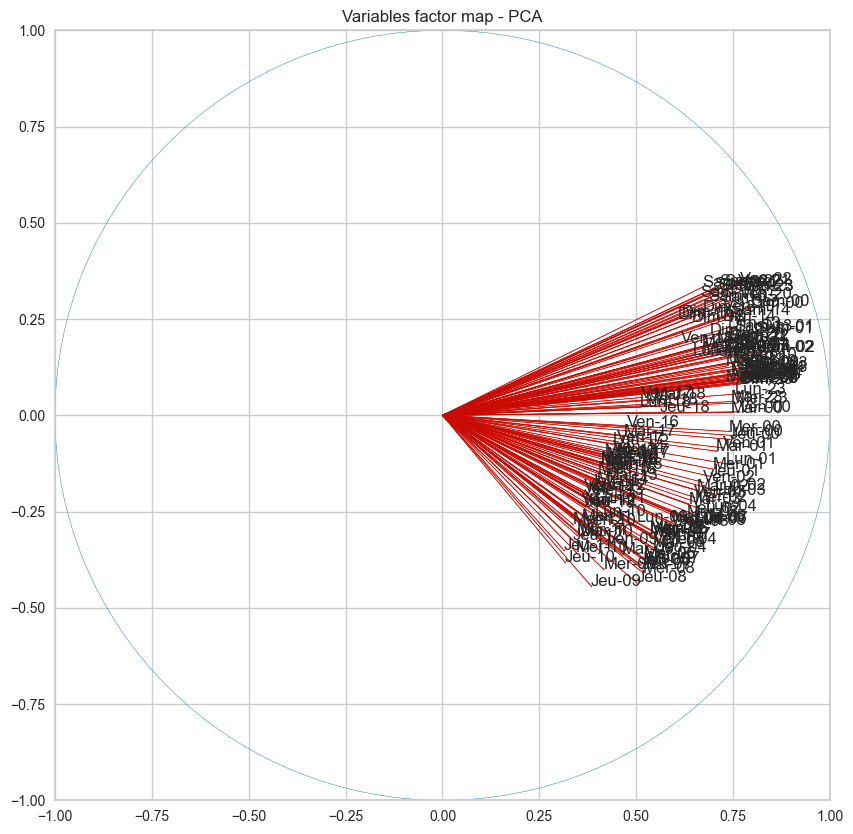

In [437]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[2] * np.sqrt(pca.explained_variance_[2])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()


On voit que pour les dimensions 1 et 3 les flèches sont plus courtes : les variables sont moins bien expliquées (ce qui est normal car la dimension 3 explique moins de variance que la dimension 2).

## Interprétation des dimensions de l'ACP

Dans cette partie, nous rappelons que les composantes principales sont des combinaisons linéaires des variables initiales.


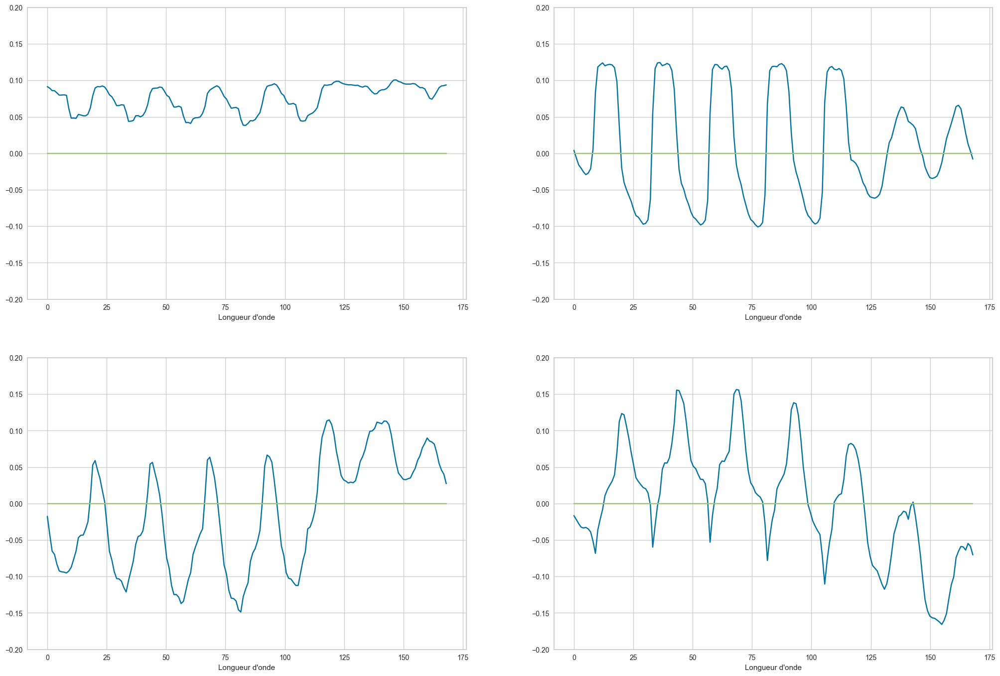

In [438]:
fig = plt.figure(1, figsize = (25, 35))
u= np.linspace(0,168,168)
for i in range(4):
   fig.add_subplot(4, 2, i+1)
   plt.ylim((-0.2, 0.2))
   plt.plot(u, pca.components_[i])
   plt.plot(u, [0] * len(u))
   plt.xlabel("Longueur d'onde")
plt.show()

Les 4 plots représentent les coefficients pour les 168 heures, et pour les 4 premières dimensions de l'ACP.

Le premier plot (sur la dimension 1) on voit que tous les coeffs sont à peu près égaux, ce qui montre que la 1ère composantes est proportionnelle à la moyenne des chargements sur toutes les stations au cours des heures.

Le deuxième plot (sur la dimension 2) montre le contraste entre le jour et la nuit: en pleine journée les coeffs sont positifs alors que la nuit ils sont négatifs.

Les plots 3 et 4 sont plus difficiles à interpréter, même si on remarque plutôt sur le troisième plot (dimension 3) le contraste entre les jours en pleine semaine et le week-end.


Ce résultat se retrouve sur le cercle des corrélations : sur la composante 1, les variables ont à peu près la même coordonnées (même position sur l'axe x), tandis que sur la composante 2, il y a 2 groupes qui semblent se dégager. En haut on distingue les heures correspondant à la journée, et en bas à la nuit (les heures entre ces deux périodes : début de matinée ou fin de soirée se retrouvent avec une coordonnée proche de 0 selon l'axe y).

## Projection des individus sur le plan ACP

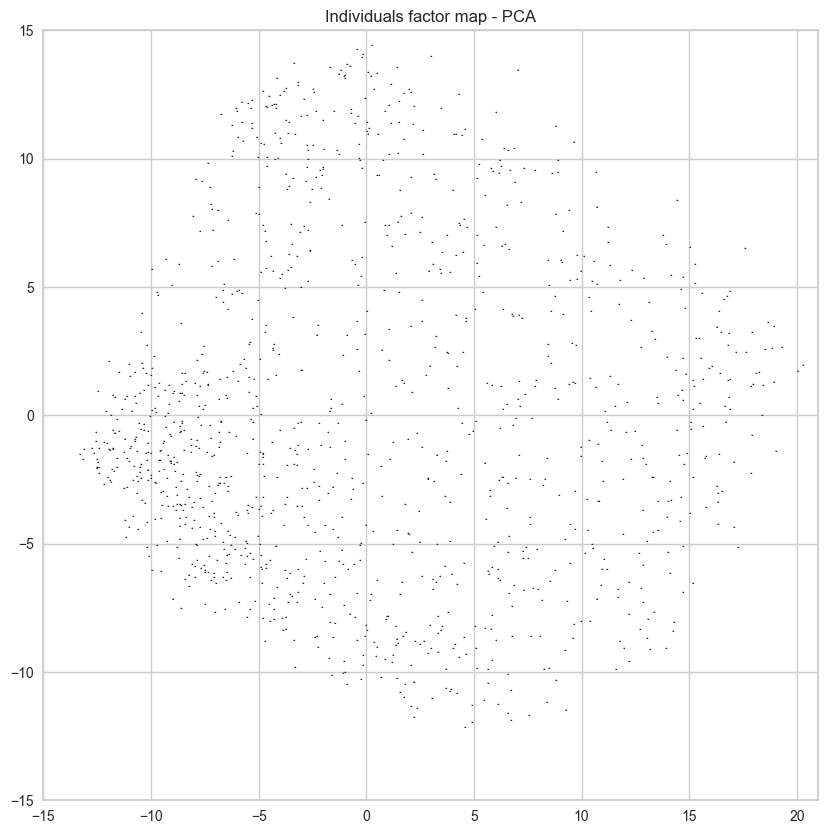

In [439]:
pc1 = C[:,0]
pc2 = C[:,1]
plt.figure(figsize = (10, 10))
for i, j in zip(pc1, pc2):
    plt.text(i, j, ".")
plt.axis((-15, 21, -15, 15))
plt.title('Individuals factor map - PCA')
plt.show()

In [440]:

velib_PCA_reduced= C[:,:3] 


# Clustering


Nous allons maintenant essayer de regrouper les stations en différentes classes. Pour cela utiliser des méthodes de Clustering.
Commenons d'abord par du clustering Kmeans.


## Kmeans

In [441]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import cdist
from matplotlib.patches import Ellipse

In [442]:
def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

## Choix du nombre de clusters 

### Avec l'inertie

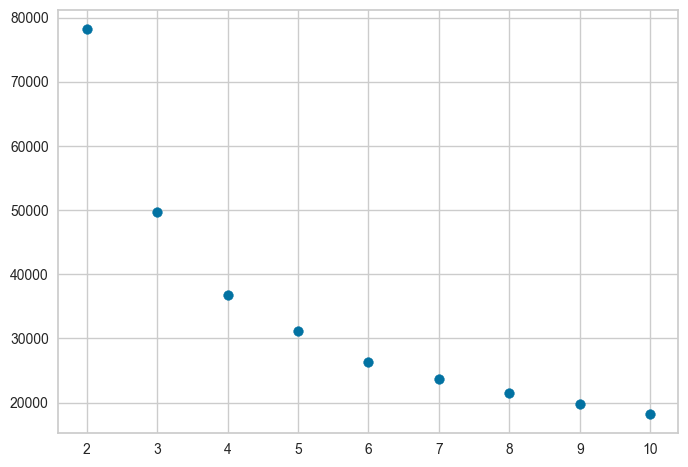

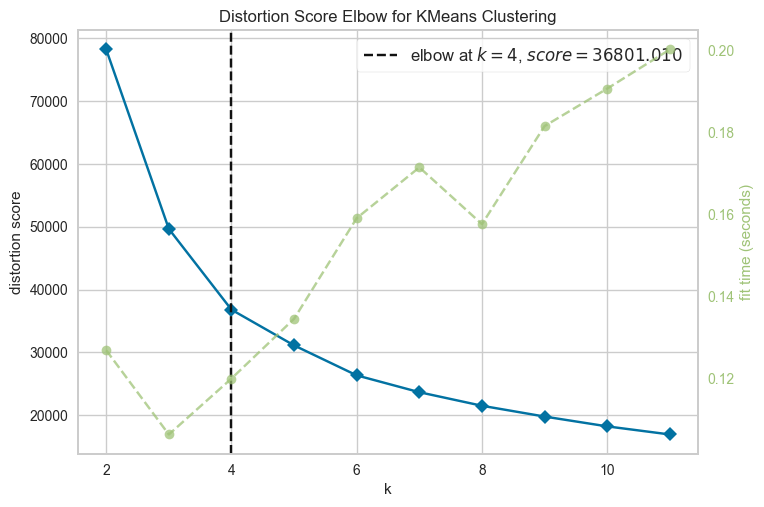

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [443]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    kmeans.fit(velib_PCA_reduced)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)

plt.scatter(range(2, 11), inertia[1:])
plt.show()


kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(2,12))

visualizer.fit(velib_PCA_reduced)   
visualizer.show()    

Un bon clustering minimise l'inertie intra-classes et maximise l'inter-classes. 
Pour trouver le nombre optimal de clusters, on fait la méthode du coude : on garde 4 clusters.

### Graphes Silhouette


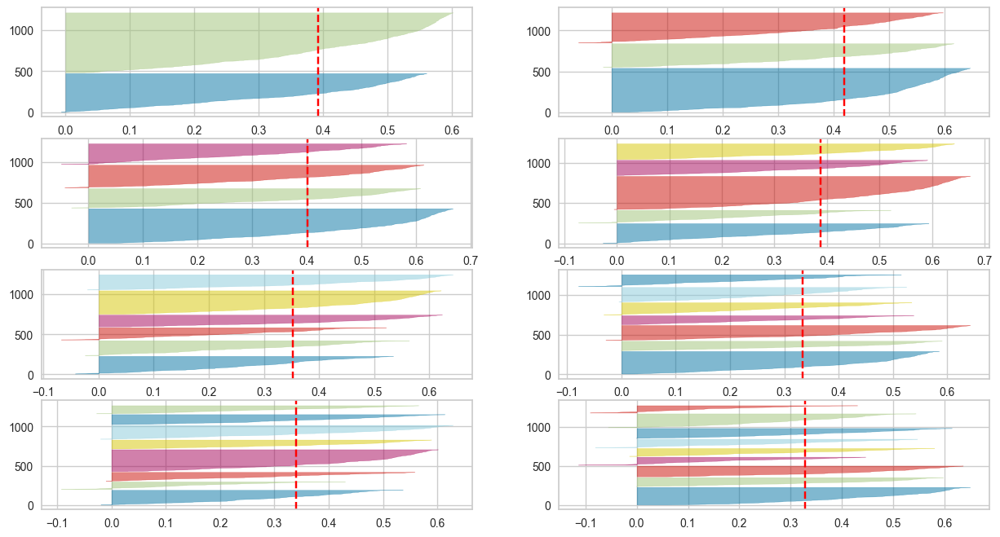

In [444]:
fig, ax = plt.subplots(4, 2, figsize=(15,8))

for k in range(2, 10):
   
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(velib_PCA_reduced)

Ce graphe silouhette confirme les 3 clusters choisis à la méthode précédente: on a moins de valeurs négatives, les pics dépassent tous la moyenne (ligne rouge), qui est d'ailleurs la plus haute. On voit donc que 3 clusters est le meilleur choix pour Silhouette. 


Les méthodes Silouhette et inertie Intra ne donnent pas le même nombre de clusters. 
Nous choisissons arbitrairement 4 clusters pour la suite.

## Projection des individus selon leur cluster faits sur les 4 composantes principales

### Composantes 1 et 2

In [445]:
K = 4
kmeans_pca = KMeans(n_clusters=K, random_state=0)
clusters_pca = kmeans_pca.fit_predict(velib_PCA_reduced)
cmap = plt.get_cmap('Set3',K)

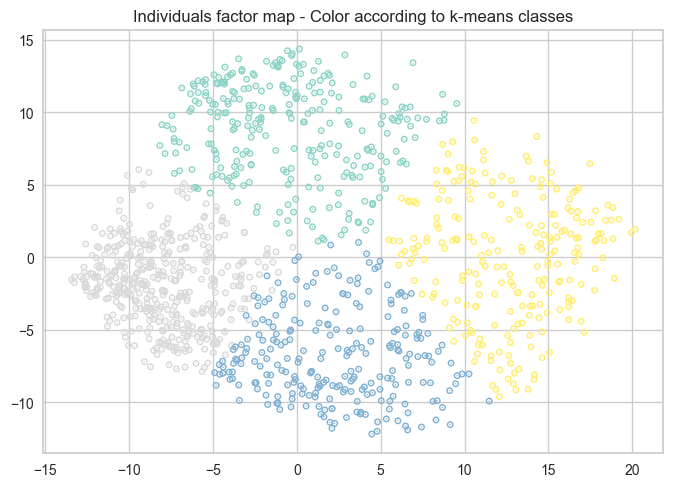

In [446]:
# on plot par rapport au clustering fait sur le jeu de données réduit
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_pca, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - Color according to k-means classes")
plt.grid(True)
plt.show()


## Projection des individus selon leur cluster faits sur les données brutes


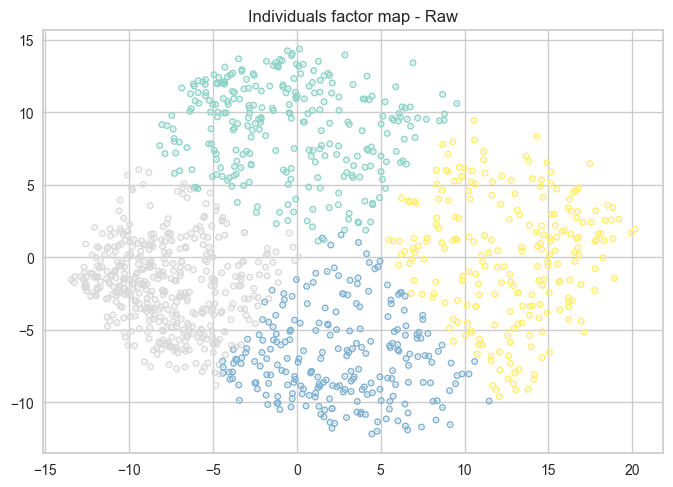

In [447]:
#On fait un clustering Kmeans sur le jeu de données loading complet
K = 4
kmeans_raw = KMeans(n_clusters=K, random_state=0)
clusters_raw = kmeans_pca.fit_predict(loading)

plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_raw, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - Raw")
plt.show()

On remarque que ces résultats entre les données brutes et les données réduites sont quasiment identiques.

Ceci montre que les 4 premières composantes expliquent la majorité des données, on a donc très peu de perte d'information en réduisant la dimension.


## Matrices de confusion pour comparer nos clusters


Classes size: [276 234 423 233]
Class (in the classif1 numbering): [0 1 2 3]



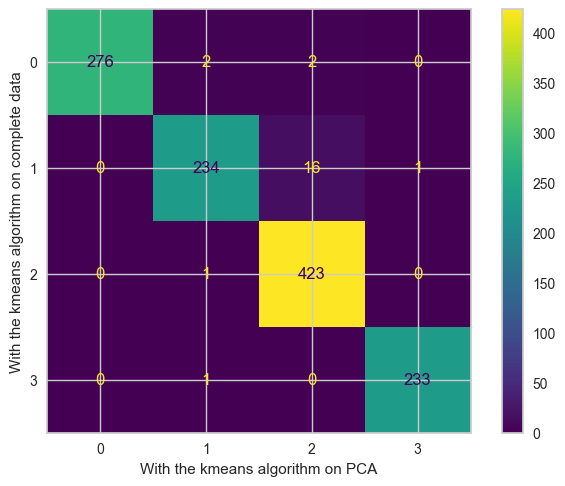

In [448]:
cm, clusters_kmean_raw_sorted = matchClasses(clusters_pca, clusters_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm on PCA')
plt.ylabel('With the kmeans algorithm on complete data')

plt.show()

On trouve des grandes valeurs dans la diagonale, ce qui confirme les plots précédents : on a des résultats similaires sur le jeu de données complet et sur celui réduit (en gardant seulement les 4 composantes principales)


## Visualiser par cartographie le Kmeans sur le jeu de données réduit et complet:

### Jeu de données réduit

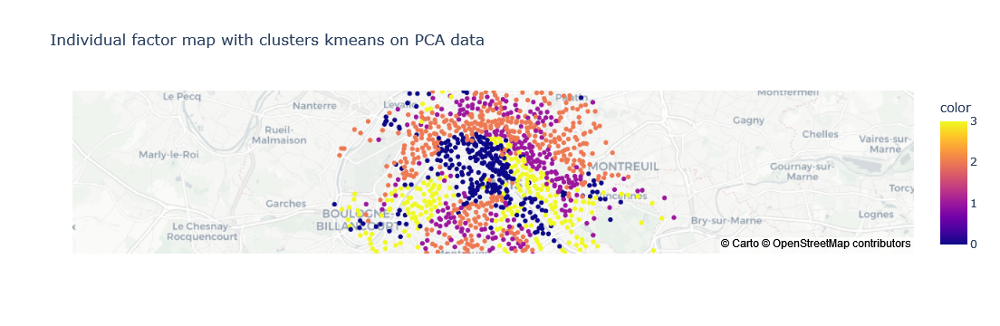

In [449]:
Position=np.array(Coord)[:,0:2]

df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_pca.astype(int)
    

})


fig_cluster_pca = px.scatter_mapbox(clusters_pca ,Position[:,1],Position[:,0], color = clusters_pca,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters kmeans on PCA data")
fig_cluster_pca.show()

### Jeu de données complet


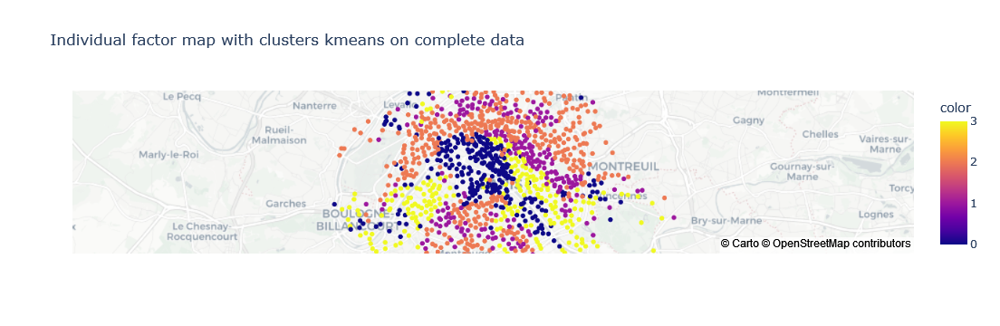

In [450]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmean_raw_sorted.astype(int)

})


fig_cluster_raw = px.scatter_mapbox(clusters_kmean_raw_sorted ,Position[:,1],Position[:,0], color = clusters_kmean_raw_sorted,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",title ="Individual factor map with clusters kmeans on complete data")
fig_cluster_raw.show()

On remarque qu'il n'y a presque aucun changement entre les deux cartographies, que ce soit pour les clusters faits sur les données PCA, ou les clusters faits sur les données brutes. Ceci nous donne le même résultat qu'obtenu par la table de contingence.

## Que représentent ces 4 clusters Kmeans sur les données réduites ?


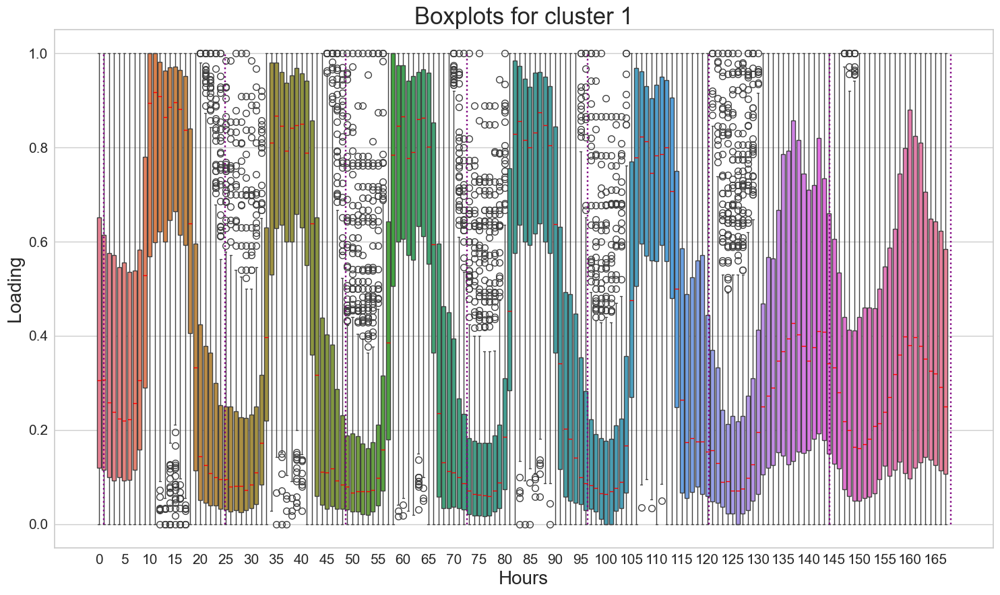

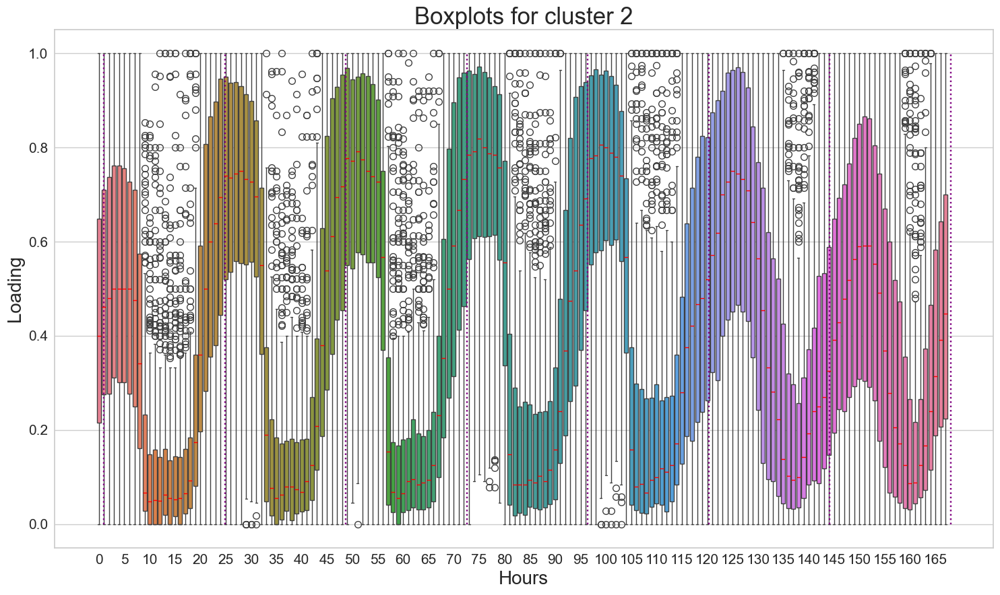

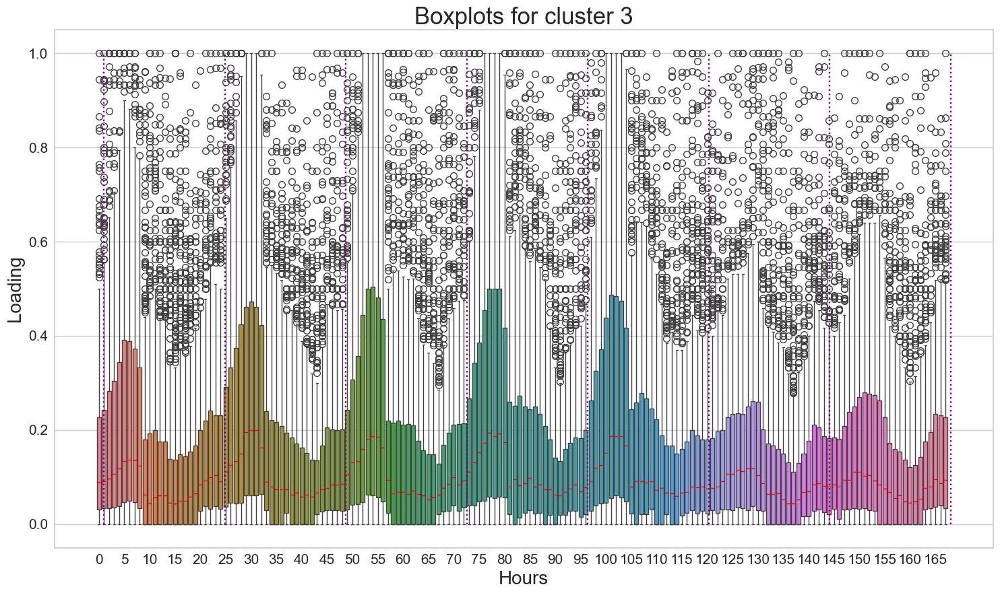

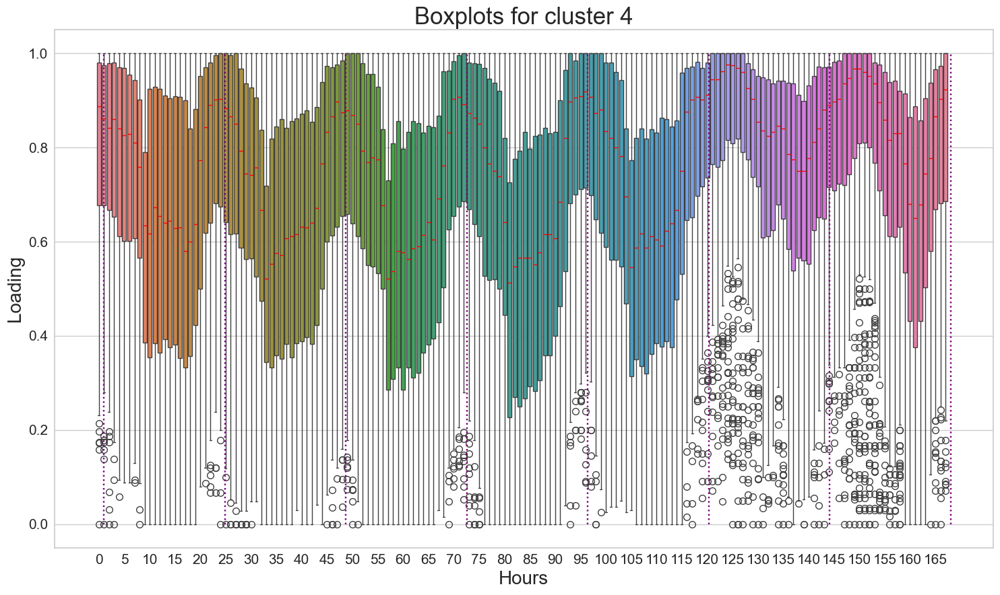

In [451]:
for i in range(4):
    indice = (clusters_pca==i).nonzero()
    indice = np.array(indice)

        
    figure(figsize = (15,9))
    sns.boxplot(data=ar[indice,:][0], medianprops={"color": "red"},)
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)
    

    plt.xlabel('Hours',fontsize = 20)
    plt.ylabel('Loading', fontsize = 20)
    plt.title("Boxplots for cluster " + str(i+1), fontsize = 25)
    plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
    plt.yticks(fontsize = 15)
    plt.tight_layout()
    plt.show()
    plt.show()


On obtient des différences significatives pour les 4 clusters : 
- Cluster n°1 : Vide le soir et le matin, plein dans l'après-midi.
- Cluster n°2 : Inverse du n°1 : vide l'après-midi, plein le matin et le soir.
- Cluster n°3 : Souvent vide en général, quasiment tout le temps vide de 8h à 18h.
- Cluster n°4 : Souvent plein en général, quasiment tout le temps plein de 21h à 8h.

Rq : La numérotation des clusters peut changer en fonction de la compilation.

# Agglomerative Clustering

## Choix optimal du nombre de clusters


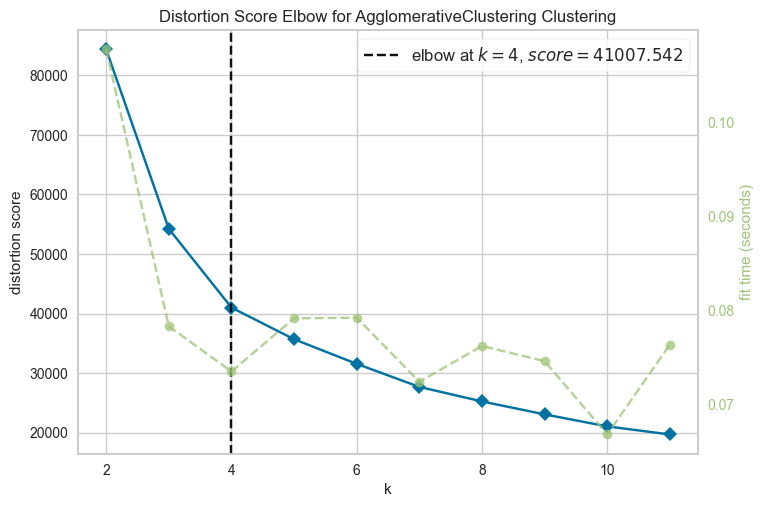

In [452]:
ac = AgglomerativeClustering(linkage='ward', compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(2,12))

visualizer.fit(velib_PCA_reduced)  
visualizer.show()   
plt.show()


La méthode du coude nous suggere de prendre 4 clusters.

De même que pour Kmeans, on décide de garder arbitrairement 4 clusters.

## Dendogramme coloré en fonction des classes


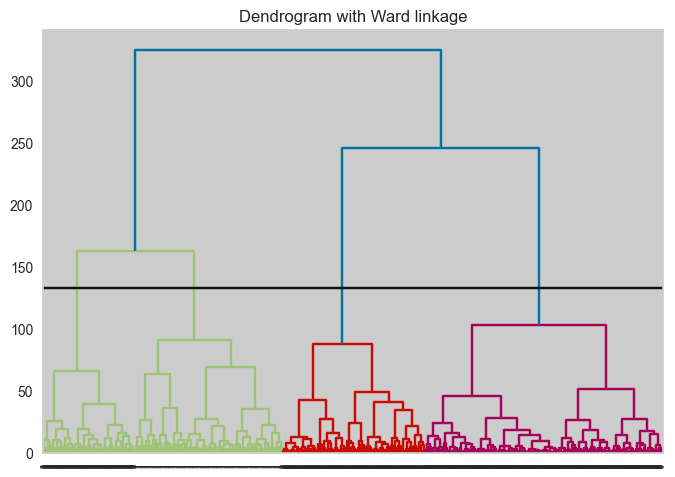

In [453]:
K = 4

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters = ac.fit(velib_PCA_reduced)

children = ac.children_
distances = ac.distances_
n_observations = np.arange(2, children.shape[0]+2)
linkage_matrix = np.c_[children, distances, n_observations]

sch.dendrogram(linkage_matrix, labels=ac.labels_)

max_d = .5*(ac.distances_[-K]+ac.distances_[-K+1])
plt.axhline(y=max_d, c='k')

plt.title("Dendrogram with Ward linkage")
plt.show()


On voit bien les 4 clusters.


## Projection des individus selon leur cluster faits sur les 4 composantes principales


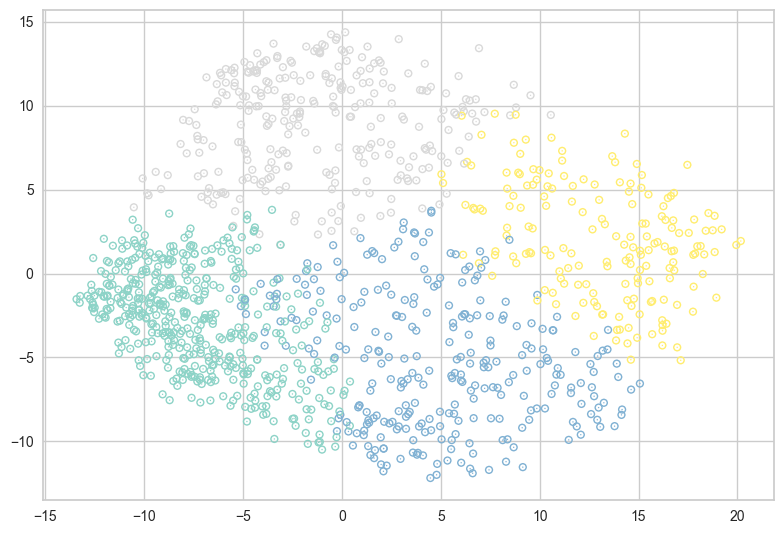

In [454]:
K = 4

cmap = plt.get_cmap('Set3', K)

# -- #

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac = ac.fit_predict(velib_PCA_reduced)

# -- #

# On the PCA dataset
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_ac, s=1, linewidths=5, cmap=cmap)

plt.tight_layout()
plt.show()


## Projection des individus selon leur cluster faits sur les données brutes


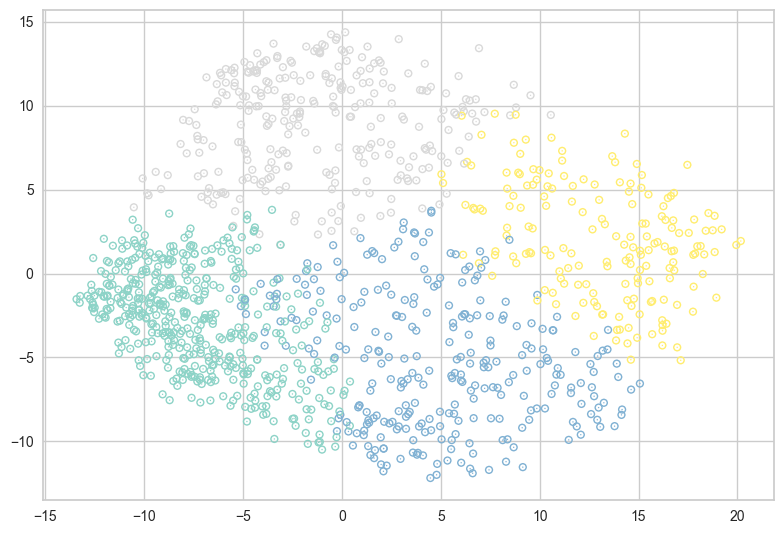

In [455]:
K = 4

cmap = plt.get_cmap('Set3', K)

# -- #

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')

# On the complete dataset

clusters_ac_raw = ac.fit_predict(loading)

# -- #

#Pour la projection a besoin des 2 premières composantes principales
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_ac, s=1, linewidths=5, cmap=cmap)

plt.tight_layout()
plt.show()

On voit encore une fois que les deux clustering sont similaires. On ne pert donc pas d'information en faisant une PCA.


## Matrice de Confusion pour les clusters CAH sur le jeu de données réduit et brutes.


Classes size: [257 124 393 119]
Class (in the classif1 numbering): [2 3 0 1]



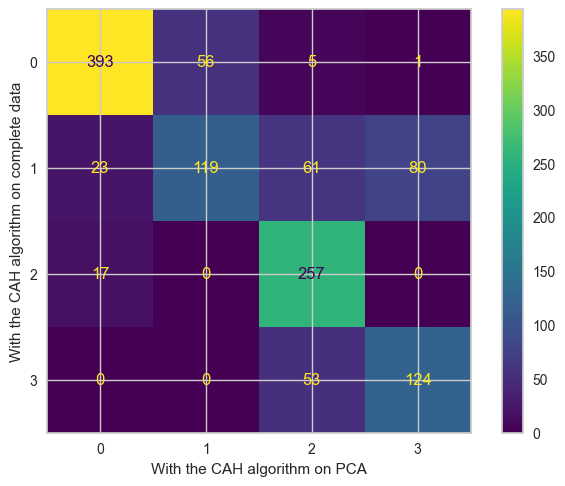

In [456]:
cm, clusters_ac_raw_sorted = matchClasses(clusters_ac, clusters_ac_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the CAH algorithm on PCA')
plt.ylabel('With the CAH algorithm on complete data')

plt.show()

On a des résultats similaires sur le jeu de données complet et sur celui réduit (en gardant seulement les 4 composantes principales), ce qui confirme les plots précédents.
## Visualiser par cartographie le CAH sur le jeu de données réduit et complet:


In [457]:

df_clusters_pca =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_ac.astype(int)
    

})


fig_cluster_pca2 = px.scatter_mapbox(clusters_ac ,Position[:,1],Position[:,0], color = clusters_ac,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters CAH on PCA data")

fig_cluster_pca2.update_layout(showlegend=True)
fig_cluster_pca2.show()

In [458]:

df_clusters_pca =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_ac_raw_sorted.astype(int)
    

})


fig_cluster_ac_raw = px.scatter_mapbox(clusters_ac_raw_sorted ,Position[:,1],Position[:,0], color = clusters_ac_raw_sorted,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters CAH on complete data")

fig_cluster_ac_raw.update_layout(showlegend=True)
fig_cluster_ac_raw.show()

Pareil ici peu de différences dans l'ensemble, sauf en périphérie !

## Comparaison clustering CAH et Kmeans sur données PCA


Classes size: [256 181 384 169]
Class (in the classif1 numbering): [2 1 0 3]



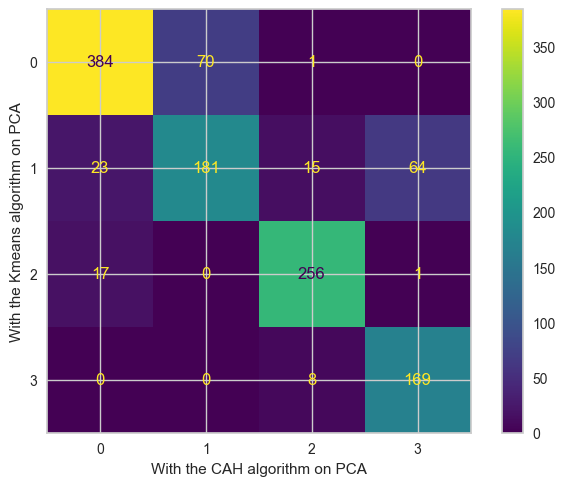

In [459]:
cm, _ = matchClasses(clusters_ac, clusters_pca)

ConfusionMatrixDisplay(cm).plot()

plt.xlabel('With the CAH algorithm on PCA')
plt.ylabel('With the Kmeans algorithm on PCA')

plt.show()

In [460]:
from sklearn.metrics import adjusted_rand_score

print(adjusted_rand_score(clusters_ac, clusters_pca))

0.641058286406066


On remarque une forte correspondance entre les 2 méthodes de clustering.
Kmeans et CAH mènent donc à des clusters similaires.
Ceci est confimé par le ARI qui vaut 0.6 montrant une similarité entre ces deux clusterings.

# Gaussian Mixture Models : A CHANGER !!!

In [461]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

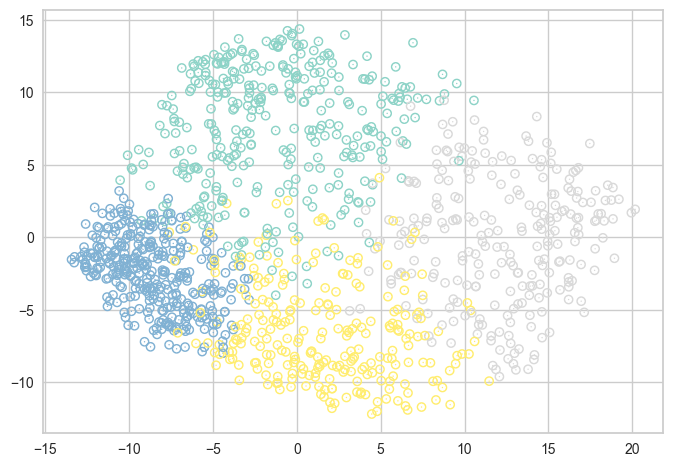

In [462]:
gmm = GaussianMixture(n_components=K, n_init=50)
clusters_gmm = gmm.fit_predict(velib_PCA_reduced)


plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_gmm, s=1, linewidths=6, cmap=cmap)

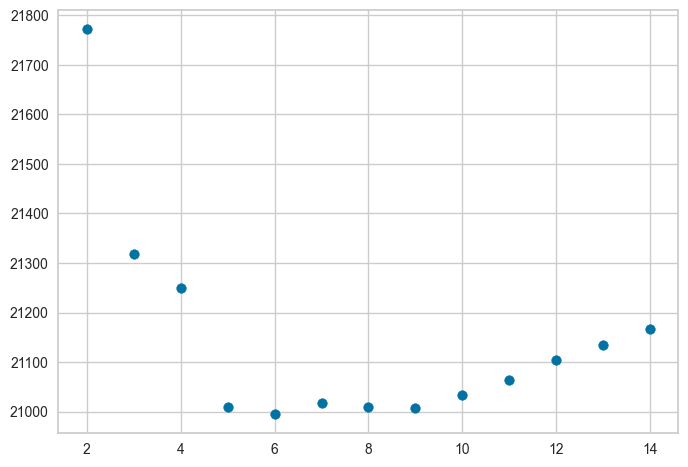

In [463]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(velib_PCA_reduced)
    bic.append(gmm.bic(velib_PCA_reduced))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

In [ ]:
k_max = 10

silhouette = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=30)
    clusters_gmm = gmm.fit_predict(velib_PCA_reduced)
    silhouette.append( silhouette_score(velib_PCA_reduced, clusters_gmm, metric='euclidean') )
silhouette = np.array(silhouette)

plt.scatter(range(2, k_max), silhouette)
plt.show()


Interprétation : Le critère BIC nous dit qu'il faut 8 clusters.

In [ ]:
def draw_ellipse(mean, covariance, alpha, ax, col='#CCCCCC'):
    """Draw an ellipse with a given position and covariance"""    
    # Convert covariance to principal axes
    U, s, Vt = np.linalg.svd(covariance)
    angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
    width, height = 2 * np.sqrt(s)

    # Draw the Ellipse
    ax.add_patch(Ellipse(mean, 4*width, 4*height, angle=angle, alpha=alpha, fc=col))

In [ ]:
def plotGMM(gmm, data, n_clusters=6):
    gmm.fit(data)
    clusters_gmm = gmm.predict(data)
    
    ax = plt.gca()
    ax.axis('equal')
    cmap = plt.get_cmap('Set3', n_clusters)
    
    # plot the input data
    ax.scatter(data[:, 0], data[:, 1], c=clusters_gmm, s=1, linewidths=1, cmap=cmap)
    
    # w_factor = 0.2 / gmm.weights_.max()
    for i in range(n_clusters):
        mean = gmm.means_[i,:2]
        covariance = gmm.covariances_[i,:2,:2]
        w = gmm.weights_[i]
        draw_ellipse(mean, covariance, w, ax, cmap.colors[i])


In [ ]:
K = 8
gmm = GaussianMixture(n_components=K, init_params='kmeans')

plotGMM(gmm,velib_PCA_reduced ,K)

## Comparaison des clusters entre GMM et Kmeans en utilisant la matrice de confusion

In [ ]:
from scipy.spatial.distance import cdist
from matplotlib.patches import Ellipse

In [ ]:
def plotKmeans(kmeans, data, n_clusters=4):
    kmeans.fit(data)
    clusters_kmeans = kmeans.predict(data)

    ax = plt.gca()
    ax.axis('equal')
    cmap = plt.get_cmap('Set3', n_clusters)

    # plot the input data
    ax.scatter(data[:, 0], data[:, 1], c=clusters_kmeans, s=1, linewidths=1, cmap=cmap)
    
    # plot the representation of the KMeans model
    centers = kmeans.cluster_centers_
    radius = [cdist(data[clusters_kmeans == i], [center]).max() for i, center in enumerate(centers)]
    for i in range(n_clusters):
        ax.add_patch(plt.Circle(centers[i], radius[i], fc=cmap.colors[i], alpha=0.3))

In [ ]:
K = 4
kmeans = KMeans(n_clusters=K)

plotKmeans(kmeans, velib_PCA_reduced,K)

In [ ]:
kmeans = KMeans(n_clusters=4, n_init=10)
clusters_kmeans = kmeans.fit_predict(velib_PCA_reduced)

gmm = GaussianMixture(n_components=7, n_init=10, init_params='kmeans')
clusters_gmm = gmm.fit_predict(velib_PCA_reduced)

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

In [ ]:
cm, clusters_kmeans_sorted = matchClasses(clusters_gmm, clusters_kmeans)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm')
plt.ylabel('With the GMM algorithm')

plt.show()

### Comparaison des clusters à l'aide de la map de Paris

In [ ]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_gmm.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_gmm, lat=Position[:,1], lon=Position[:,0], color=clusters_gmm,
                    color_discrete_sequence=['aliceblue', 'darkgrey', 'forestgreen', 'fuchsia'],
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters GMM on pca")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

In [ ]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmeans_sorted.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_kmeans_sorted, lat=Position[:,1], lon=Position[:,0], color=clusters_kmeans_sorted,
                    color_discrete_sequence=['aliceblue', 'darkgrey', 'forestgreen', 'fuchsia'],
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters Kmeans on pca")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

## Comparaison CLUSTERS CAH et GMM

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

In [ ]:
ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac = ac.fit_predict(velib_PCA_reduced)

gmm = GaussianMixture(n_components=8, n_init=10, init_params='kmeans')
clusters_gmm = gmm.fit_predict(velib_PCA_reduced)

In [ ]:
cm_gmm_cah, clusters_cah_sorted = matchClasses(clusters_gmm, clusters_ac)

ConfusionMatrixDisplay(cm_gmm_cah).plot()
plt.xlabel('With the CAH algorithm on PCA')
plt.ylabel('With the GMM algorithm on PCA')

plt.show()

# CA

In [ ]:
import numpy as np
import prince

import matplotlib.pyplot as plt
import seaborn as sns

## CA : Matrice Confusion CAH

In [ ]:
cm, clusters_ac_raw_sorted = matchClasses(clusters_ac, clusters_ac_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the CAH algorithm on PCA')
plt.ylabel('With the CAH algorithm on complete data')

plt.show()

print(cm)


# convert numpy array to dataframe
df_cm = pd.DataFrame(cm, columns =['gr0', 'gr1', 'gr2', 'gr3'])
print("\nPandas DataFrame: ")
df_cm

In [ ]:
ca = prince.CA(
    n_components=15,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
ca = ca.fit(df_cm)

In [ ]:
ca.eigenvalues_summary

In [ ]:
ca.row_coordinates(df_cm)

In [ ]:
ca.column_coordinates(df_cm)

In [ ]:
ca.plot(
    df_cm,
    x_component=0,
    y_component=1,
    show_row_markers=True,
    show_column_markers=True,
    show_row_labels=False,
    show_column_labels=False
)

In [ ]:
ca.row_contributions_.style.format('{:.0%}')

In [ ]:
ca.column_contributions_.style.format('{:.0%}')

In [ ]:
ca.row_cosine_similarities(df_cm)

In [ ]:
ca.column_cosine_similarities(df_cm)

# MCA

## MCA sur toutes les données

In [ ]:
# Définis les seuils
seuils = {
    'Vide': 0.2,
    'Faible': 0.4,
    'Moyen': 0.6,
    'Fort': 0.8,
    'Pleine': 1.0
}

# Définis les seuils
seuilsV2 = {
    'Vide': 0.33,
    'Moyen': 0.66,
    'Pleine': 1.0
}

seuilsV3 = {
    'Totalement Vide': 0.1,
    'Très Vide': 0.2,
    'Assez Faible': 0.3,
    'Faible': 0.4,
    'Moyen': 0.5,
    'Pas mal': 0.6,
    'Bien': 0.7,
    'Très Bien': 0.8,
    'Quasiment Pleine': 0.9,
    'Pleine': 1.0
}

# Définis les seuils
seuilsV4 = {
    'Vide': 0.5,
    'Plein': 1,
}

#Convertis les données en valeurs de seuil
def convert_to_threshold(value):
    for seuil, threshold in seuils.items():
        if value <= threshold:
            return seuil
    return 'très élevé'  # Si la valeur dépasse le seuil maximal

#Applique la fonction de conversion à chaque cellule du DataFrame
loading_quali = loading.applymap(convert_to_threshold)

loading_quali['Hill'] = Coord['bonus'].map({0: 'FAUX', 1:'VRAI'})
loading_quali['Hill2'] = Coord['bonus']




#Affiche le DataFrame avec les données qualitatives
loading_quali.head()

In [ ]:
Coord

In [ ]:
mca = prince.MCA(
    n_components=10,
    n_iter=50,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
mca = mca.fit(loading_quali)

In [ ]:
display(mca.eigenvalues_summary)

mca.scree_plot()

#vap sup à 1, mieux qu'avant en term de variances expliquées
#vap inf à 1, moins bien qu'avant

In [ ]:
mca.plot(
    loading_quali,
    x_component=0,
    y_component=1,
    show_column_markers=True,
    show_row_markers=True,
    show_column_labels=False,
    show_row_labels=False
)

#on projette dans ce graphe le résultat de la MCA 
#Elle affiche de couleurs diff si la personne a survécu ou non 

In [ ]:
#ESt-ce qu'on peut faire en sorte 

def plot_mca(ax1=0, ax2=1, mca=mca, data2=loading_quali):
    dataset = mca.transform(data2)
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['Hill2'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['Lun-00'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()

In [ ]:
plot_mca(0,1)
plot_mca(1,2)
plot_mca(2,3)

In [ ]:
contrib = mca.column_contributions_.head(10).style.format('{:.1%}')
display(contrib.highlight_max(color='orange').highlight_min(color='lightblue'))

In [ ]:
#individus bien rep ? 
#ex : premier ind bien rep par la composante 10
quality_row = mca.row_cosine_similarities(loading_quali).head(10).style.format('{:.3}')
display(quality_row)

quality_column = mca.column_cosine_similarities(loading_quali).style.format('{:.3}')
#display(quality_column.background_gradient())

## MCA sur les données jours nuit
Exemple : 

Lundi jour : Lun-07 à Lun-21

Lundi nuit : Lun-22 à Mar-06

In [382]:
labels = ['Nohill','Hill']

X_quali = pd.DataFrame({'hill' : Coord['bonus'].map(dict(zip([0, 1], labels)))})
jour = list(range(9,20)) # on se dit que la journée est de 7h à 21h
print(jour)
nuit = list(range(20,33)) # pareil pour la nuit mais de 21h à 7h
print(nuit)

load = ['faible', 'moyen', 'fort']

[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]


In [383]:
# on rassemble les heures de la journée par jour 

for i in range(1, 8):
    hour_offset = [x + (i-1)*24 for x in jour]
    newCol = loading.iloc[:, jour[0]+(i-1)*24: jour[-1]+ (i-1)*24+1].mean(axis=1)
    breaks = [-0.01, 0.33, 0.66, 1.01]
    #breaks = [-0.01, 0.2, 0.8, 1.01]
    newCol = pd.cut(newCol, bins=breaks, labels=load)
    newName_jour = 'Jour' + str(i)
    X_quali[newName_jour] = newCol
    

In [384]:
i=7
newCol = loading.iloc[:, jour[0]+(i-1)*24: jour[-1]+ (i-1)*24+1]
newCol.head()

,Dim-09,Dim-10,Dim-11,Dim-12,Dim-13,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19
1,0.185185,0.111111,0.111111,0.074074,0.074074,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923
2,0.739130,0.739130,0.565217,0.260870,0.173913,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913
3,0.518519,0.537037,0.425926,0.407407,0.333333,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296
4,0.380952,0.523810,0.904762,1.000000,1.000000,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143
5,0.106061,0.136364,0.181818,0.212121,0.318182,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182


In [385]:
i=7
newCol1 = loading.iloc[:, nuit[0]+(i-1)*24 : nuit[-1]+(i-1)*24+1]
newCol2 = loading.iloc[:, 0 : 9]
newCol = pd.concat([newCol1, newCol2], axis=1)
newCol.head(6)

,Dim-20,Dim-21,Dim-22,Dim-23,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08
1,0.115385,0.076923,0.153846,0.153846,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143
2,0.173913,0.173913,0.260870,0.391304,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870
3,0.314815,0.370370,0.370370,0.407407,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545
4,0.761905,0.761905,0.761905,0.761905,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000
5,0.636364,0.712121,0.621212,0.575758,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623
6,0.086957,0.434783,0.391304,0.521739,0.166667,0.166667,0.166667,0.166667,0.166667,0.166667,0.166667,0.166667,0.083333


In [386]:
#On rassemble les heures de la nuit par jour et on fait une moyenne pareil  
for i in range(1,8):
    if i == 7:
        newCol1 = loading.iloc[:, nuit[0]+(i-1)*24 : nuit[-1]+(i-1)*24+1]
        newCol2 = loading.iloc[:, 0 : 9]
        newCol = pd.concat([newCol1, newCol2], axis=1)
        newCol = newCol.mean(axis=1)
    else:
        newCol = loading.iloc[:, nuit[0]+(i-1)*24 : nuit[-1]+(i-1)*24+1].mean(axis=1)
    breaks = [-0.01, 0.33, 0.66, 1.01]
    #breaks = [-0.01, 0.2, 0.8, 1.01]
    newCol = pd.cut(newCol, bins=breaks, labels = load)
    newName_nuit = f"nuit{i}"
    X_quali[newName_nuit] = newCol.values

In [387]:
X_quali

,hill,Jour1,Jour2,Jour3,Jour4,Jour5,Jour6,Jour7,nuit1,nuit2,nuit3,nuit4,nuit5,nuit6,nuit7
1,Nohill,faible,faible,faible,faible,faible,faible,faible,moyen,moyen,moyen,moyen,moyen,faible,faible
2,Nohill,faible,faible,faible,faible,faible,moyen,faible,fort,fort,fort,fort,fort,moyen,moyen
3,Nohill,moyen,fort,moyen,moyen,moyen,moyen,faible,moyen,moyen,moyen,moyen,moyen,moyen,faible
4,Nohill,fort,fort,moyen,moyen,moyen,moyen,fort,faible,faible,faible,faible,faible,moyen,fort
5,Nohill,fort,fort,fort,fort,fort,faible,moyen,moyen,moyen,faible,moyen,moyen,faible,fort
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,Nohill,faible,faible,faible,faible,faible,faible,faible,faible,moyen,moyen,faible,faible,faible,faible
1186,Nohill,moyen,moyen,fort,fort,moyen,moyen,moyen,faible,faible,moyen,faible,moyen,moyen,faible
1187,Hill,faible,faible,moyen,faible,faible,faible,moyen,moyen,faible,moyen,faible,faible,moyen,moyen
1188,Nohill,fort,fort,moyen,faible,faible,fort,fort,fort,faible,faible,faible,moyen,fort,moyen


In [388]:
X_quali.shape

(1189, 15)

In [389]:
mca = prince.MCA(n_components = 10, n_iter = 30, copy=True, check_input = True, engine='sklearn', random_state=42) #Pourquoi 2 ????
mca.fit(X_quali)



MCA(n_components=10, n_iter=30, random_state=42)

In [390]:
display(mca.eigenvalues_summary)

mca.scree_plot()

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.428,22.15%,22.15%
1,0.262,13.55%,35.70%
2,0.146,7.54%,43.24%
3,0.121,6.28%,49.52%
4,0.111,5.73%,55.25%
5,0.068,3.53%,58.78%
6,0.064,3.31%,62.08%
7,0.058,3.01%,65.10%
8,0.058,3.00%,68.10%


alt.Chart(...)

In [391]:
type(X_quali)

pandas.core.frame.DataFrame

In [392]:
mca.plot(
    X_quali,
    x_component=0,
    y_component=1,
    show_column_markers=True,
    show_row_markers=True,
    show_column_labels=False,
    show_row_labels=False
)

alt.LayerChart(...)

In [393]:
dataset = mca.transform(X_quali)
dataset['Hill'] = X_quali['hill']
dataset.reset_index(inplace=True)
#dataset['Hill'] = X_quali['hill']
#X_quali
dataset

,index,0,1,2,3,4,5,6,7,8,9,Hill
0,1,-0.503575,-0.514420,0.696729,-0.264552,-0.320592,0.235700,-0.046523,-0.276075,-0.393088,-0.085624,Nohill
1,2,0.301254,-0.841051,-0.091446,-0.166554,0.676006,-0.316100,-0.152960,0.344328,0.068227,-0.034679,Nohill
2,3,0.242946,0.102452,1.124458,0.652902,-0.106435,0.334886,-0.183662,-0.076754,-0.138392,-0.122853,Nohill
3,4,0.355594,0.723728,-0.007522,0.582218,0.203210,0.653127,0.200912,0.394383,0.177393,0.050952,Nohill
4,5,0.377557,0.650783,0.728540,-0.628561,-0.060730,0.208175,-0.260254,-0.435835,-0.168195,0.210168,Nohill
...,...,...,...,...,...,...,...,...,...,...,...,...
1184,1185,-0.703325,-0.219341,0.077659,-0.152458,-0.226983,0.096244,-0.018730,-0.030616,-0.043721,-0.263569,Nohill
1185,1186,0.237258,0.601802,0.589613,0.497874,0.590711,-0.182869,0.157820,-0.627107,0.086755,-0.443857,Nohill
1186,1187,-0.421748,-0.212499,0.485543,0.073011,0.011329,-0.209058,0.316539,0.266072,0.688016,0.666689,Hill
1187,1188,0.477348,0.259826,-0.104318,-0.091371,-0.121160,0.272252,0.725195,0.438942,-0.540279,0.358097,Nohill


In [394]:
def plot_mcaV2(ax1=0, ax2=1, mca=mca, data2=X_quali):
    dataset = mca.transform(data2)
    dataset['Hill'] = data2['hill']
    dataset['Jour2'] = data2['Jour2']
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue='Hill', alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()
    sns.scatterplot(data = dataset, x = ax1, y = ax2,hue = 'Jour2',alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()
    dataset.head(10)

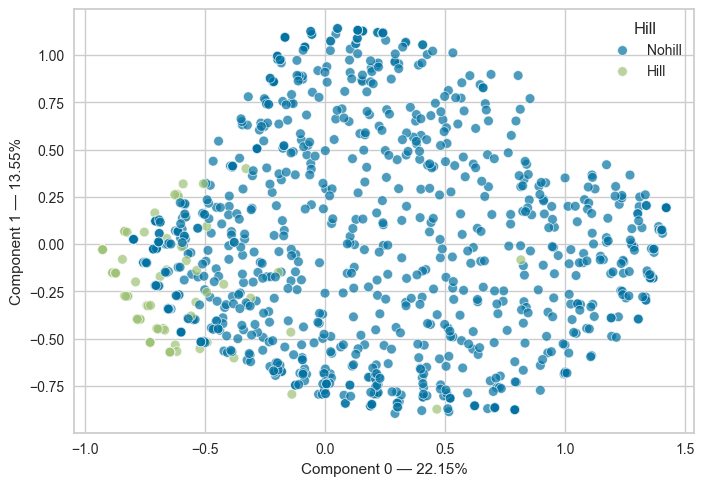

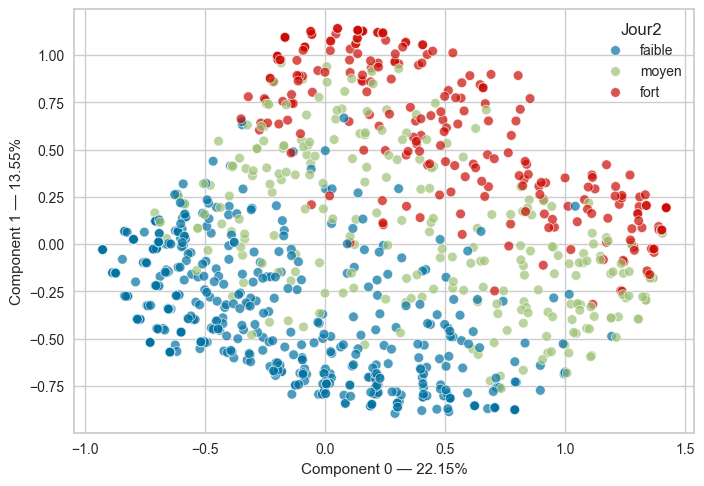

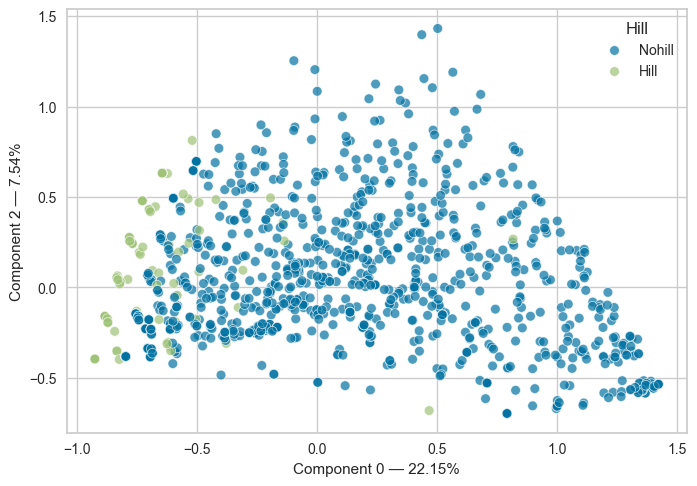

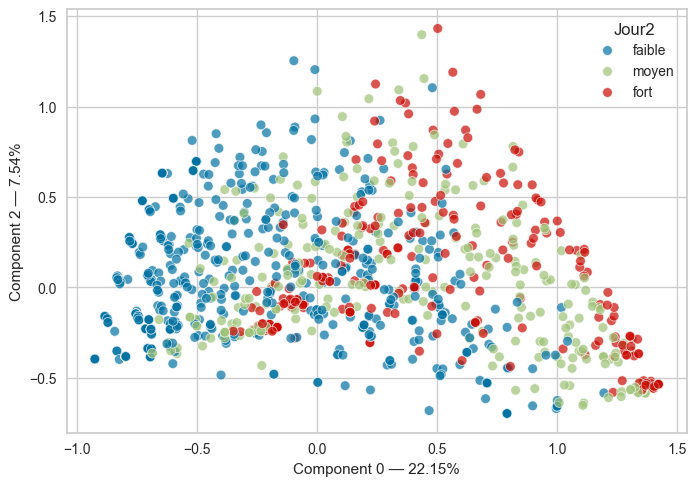

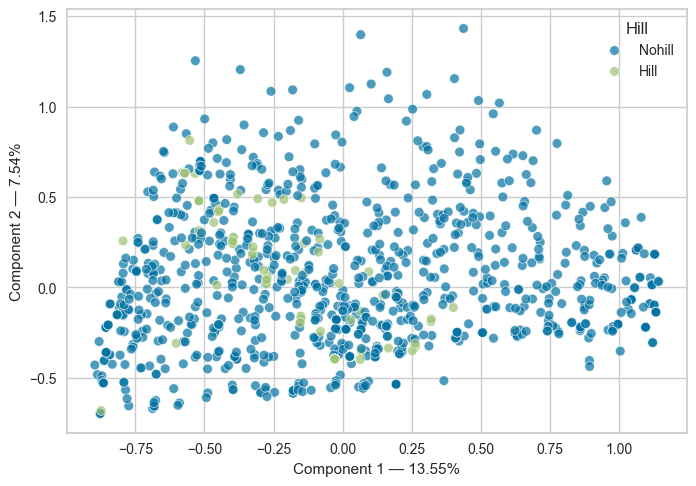

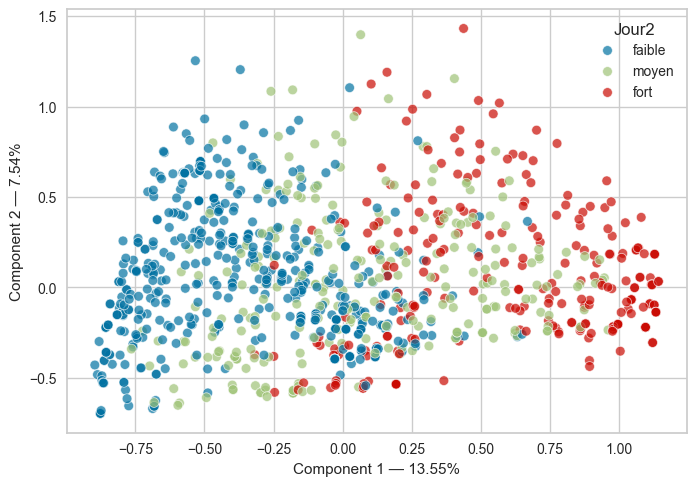

In [395]:
plot_mcaV2(0,1)
plot_mcaV2(0,2)
plot_mcaV2(1,2)

In [396]:
velib_mca_reduced = mca.row_coordinates(X_quali)
velib_mca_reduced

,0,1,2,3,4,5,6,7,8,9
1,-0.503575,-0.514420,0.696729,-0.264552,-0.320592,0.235700,-0.046523,-0.276075,-0.393088,-0.085624
2,0.301254,-0.841051,-0.091446,-0.166554,0.676006,-0.316100,-0.152960,0.344328,0.068227,-0.034679
3,0.242946,0.102452,1.124458,0.652902,-0.106435,0.334886,-0.183662,-0.076754,-0.138392,-0.122853
4,0.355594,0.723728,-0.007522,0.582218,0.203210,0.653127,0.200912,0.394383,0.177393,0.050952
5,0.377557,0.650783,0.728540,-0.628561,-0.060730,0.208175,-0.260254,-0.435835,-0.168195,0.210168
...,...,...,...,...,...,...,...,...,...,...
1185,-0.703325,-0.219341,0.077659,-0.152458,-0.226983,0.096244,-0.018730,-0.030616,-0.043721,-0.263569
1186,0.237258,0.601802,0.589613,0.497874,0.590711,-0.182869,0.157820,-0.627107,0.086755,-0.443857
1187,-0.421748,-0.212499,0.485543,0.073011,0.011329,-0.209058,0.316539,0.266072,0.688016,0.666689
1188,0.477348,0.259826,-0.104318,-0.091371,-0.121160,0.272252,0.725195,0.438942,-0.540279,0.358097


In [397]:
contrib_columns = mca.column_contributions_.style
display(contrib_columns.highlight_max(color='orange').highlight_min(color='lightblue'))

contrib_rows = mca.row_contributions_.style
#display(contrib_rows.highlight_max(color='orange').highlight_min(color='lightblue'))

,0,1,2,3,4,5,6,7,8,9
hill_Hill,0.021224,0.003761,0.000247,0.003573,0.044582,0.001111,0.004766,0.033179,0.238443,0.116814
hill_Nohill,0.002538,0.000450,0.000030,0.000427,0.005331,0.000133,0.000570,0.003968,0.028514,0.013969
Jour1_faible,0.020858,0.042025,0.000180,0.005380,0.001138,0.007147,0.002016,0.009529,0.000273,0.000268
Jour1_moyen,0.007385,0.001261,0.000131,0.123493,0.003054,0.184251,0.001336,0.094756,0.002694,0.020960
Jour1_fort,0.020596,0.076198,0.000877,0.034060,0.000017,0.054273,0.009514,0.012520,0.000352,0.009347
Jour2_faible,0.023337,0.042081,0.001104,0.007188,0.003234,0.001484,0.017888,0.014409,0.000608,0.003433
Jour2_moyen,0.011169,0.001359,0.000147,0.144255,0.004257,0.026226,0.012158,0.124981,0.003534,0.021517
Jour2_fort,0.018256,0.081618,0.001613,0.059416,0.000604,0.010041,0.010137,0.026337,0.000410,0.002866
Jour3_faible,0.020768,0.041674,0.002110,0.005809,0.002712,0.000004,0.015375,0.002313,0.000482,0.020825
Jour3_moyen,0.008789,0.002191,0.000579,0.125678,0.006468,0.022000,0.000384,0.061525,0.006929,0.270964


In [398]:
# Supposons que `styler` est ton objet Styler
# Pour accéder au DataFrame original
df1 = contrib_columns.data
df2 = contrib_rows.data

# Ensuite, pour obtenir les labels des lignes
labels_variables = df1.index.tolist()
labels_individus = df2.index.tolist()


#print(labels_variables)
#print(labels_individus)

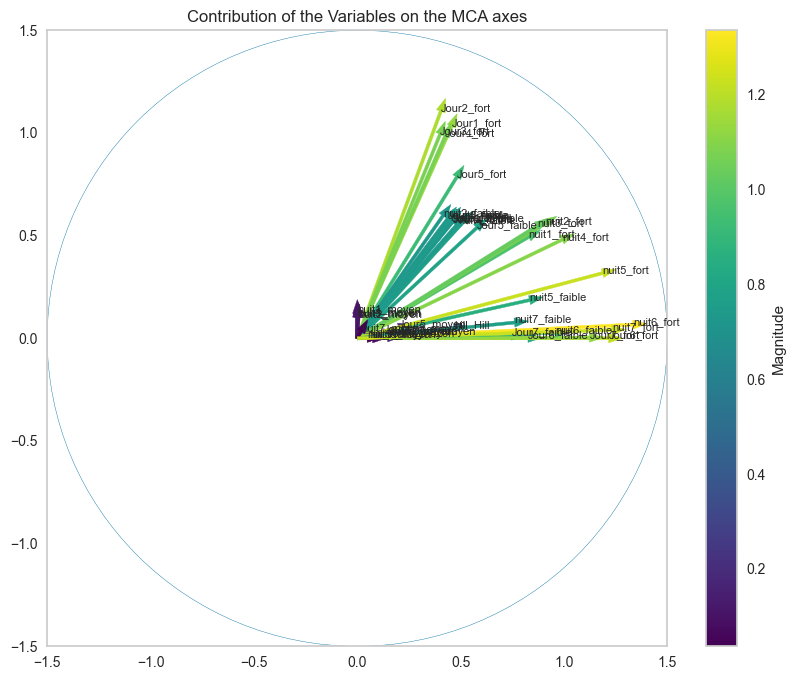

In [399]:
coord1 = mca.column_contributions_[0] * mca.percentage_of_variance_[0]
coord2 = mca.column_contributions_[1] * mca.percentage_of_variance_[1]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)

# Calcul de la magnitude des vecteurs
magnitude = np.sqrt(coord1**2 + coord2**2)

# Utilisation d'une colormap pour mapper les valeurs de magnitude à une couleur
norm = plt.Normalize(vmin=magnitude.min(), vmax=magnitude.max())
cmap = plt.cm.viridis  # Tu peux choisir une autre colormap si tu préfères

for i, j, nom, mag in zip(coord1, coord2, labels_variables, magnitude):
    color = cmap(norm(mag))
    plt.text(i, j, nom, fontsize=8)
    plt.arrow(0, 0, i, j, color=color, width=0.015)
plt.axis((-1.5, 1.5, -1.5, 1.5))

# Cercle
c = plt.Circle((0, 0), radius=1.5, color='b', fill=False)
ax.add_patch(c)

plt.title('Contribution of the Variables on the MCA axes')
plt.grid(False)

# Ajouter une barre de couleur
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Magnitude')

plt.show()

In [400]:
def plot_mca_with_contrib_cosine(ax1=0, ax2=1, mca=mca, data2=X_quali):
    dataset = mca.transform(data2)
    dataset['contrib'] = mca.row_contributions_[ax1]
    dataset['cosine'] = mca.row_cosine_similarities(data2)[ax1]
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue='contrib', alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.title("Contrib")
    plt.grid(True)
    plt.show()
    sns.scatterplot(data = dataset, x = ax1, y = ax2,hue = 'cosine',alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.title("Cosine")
    plt.grid(True)
    plt.show()
    dataset.head(10)

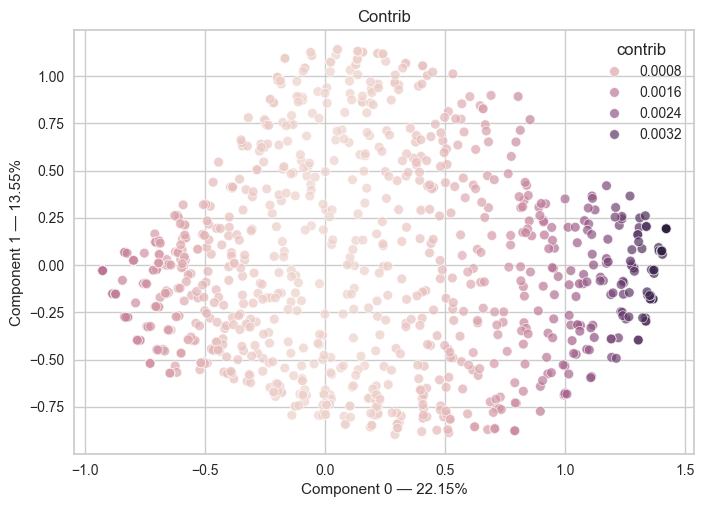

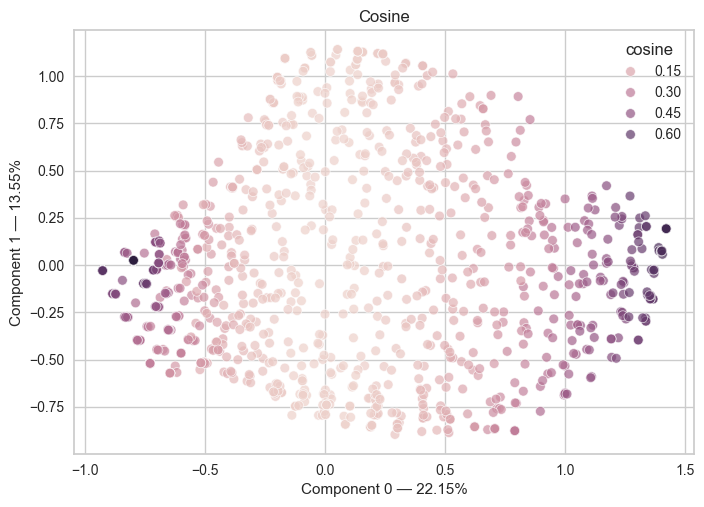

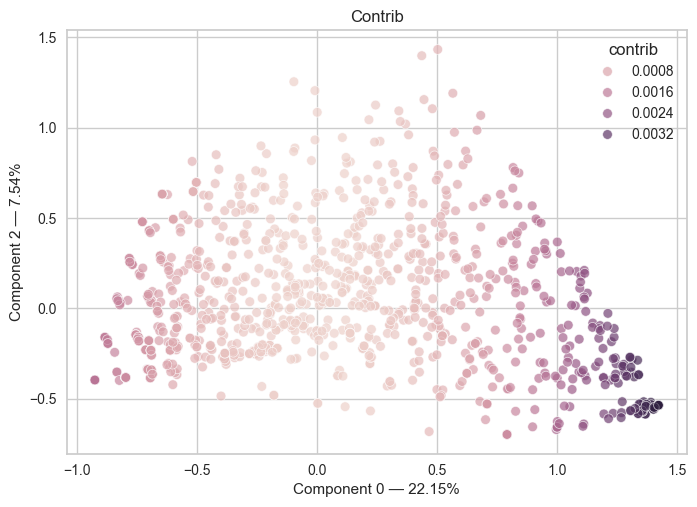

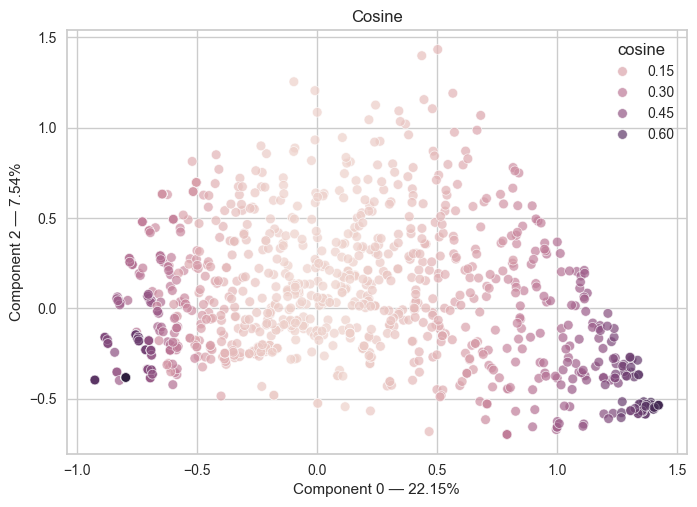

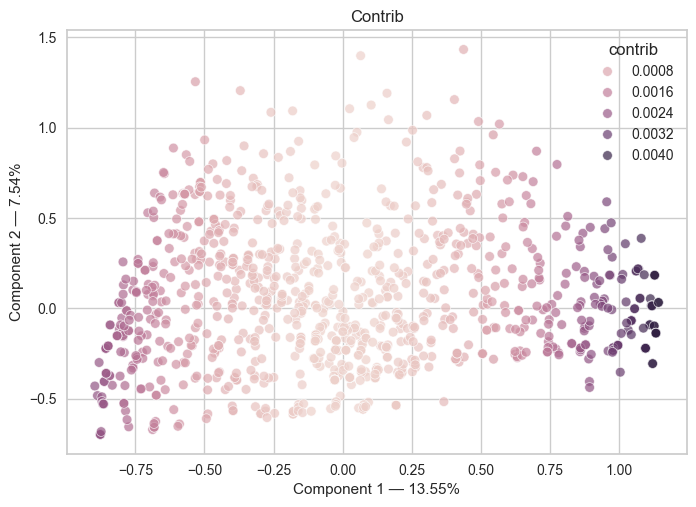

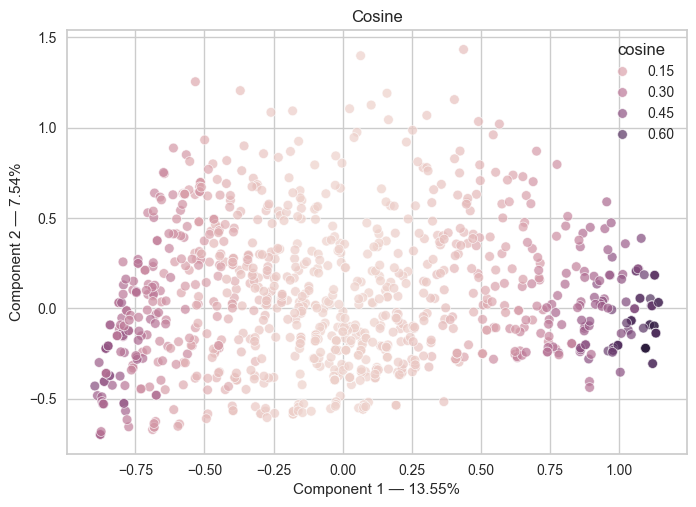

In [ ]:
plot_mca_with_contrib_cosine(0,1)
plot_mca_with_contrib_cosine(0,2)
plot_mca_with_contrib_cosine(1,2)

In [ ]:
quality_row = mca.row_cosine_similarities(X_quali).head(10).style.format('{:.3}')
display(quality_row.background_gradient())

quality_column = mca.column_cosine_similarities(X_quali).style.format('{:.3}')
display(quality_column.background_gradient())

,0,1,2,3,4,5,6,7,8,9
1,0.158,0.165,0.302,0.0435,0.0639,0.0346,0.00135,0.0474,0.0961,0.00456
2,0.0488,0.38,0.00449,0.0149,0.246,0.0537,0.0126,0.0637,0.0025,0.000646
3,0.0204,0.00362,0.436,0.147,0.00391,0.0387,0.0116,0.00203,0.00661,0.00521
4,0.053,0.219,2.37e-05,0.142,0.0173,0.179,0.0169,0.0651,0.0132,0.00109
5,0.0544,0.162,0.202,0.151,0.00141,0.0165,0.0258,0.0725,0.0108,0.0168
6,0.0424,0.155,0.013,0.0204,0.00172,0.0289,0.000382,0.00344,0.0172,0.0735
7,1.84e-05,0.242,0.213,0.013,0.00753,0.0616,0.0189,0.0236,0.0526,0.0179
8,0.00588,0.191,0.255,0.01,0.259,0.0042,0.0059,0.000117,0.00296,0.0217
9,0.212,2.45e-05,0.141,0.115,0.0487,0.208,0.00501,5.96e-05,0.0527,0.00236
10,0.00179,0.0242,0.00706,0.00411,0.00993,0.0967,0.0498,0.00631,0.0228,0.049


,0,1,2,3,4,5,6,7,8,9
hill_Hill,0.153,0.0165,0.000604,0.00729,0.0829,0.00127,0.00512,0.0325,0.233,0.111
hill_Nohill,0.153,0.0165,0.000604,0.00729,0.0829,0.00127,0.00512,0.0325,0.233,0.111
Jour1_faible,0.309,0.381,0.000909,0.0226,0.00436,0.0169,0.00446,0.0192,0.00055,0.000525
Jour1_moyen,0.0577,0.00603,0.00035,0.274,0.00617,0.23,0.00156,0.101,0.00286,0.0216
Jour1_fort,0.178,0.402,0.00257,0.0833,3.75e-05,0.0746,0.0122,0.0147,0.000411,0.0106
Jour2_faible,0.336,0.371,0.00541,0.0294,0.012,0.00341,0.0385,0.0283,0.00119,0.00653
Jour2_moyen,0.0921,0.00686,0.000412,0.338,0.00908,0.0345,0.015,0.14,0.00395,0.0234
Jour2_fort,0.151,0.414,0.00455,0.14,0.00129,0.0133,0.0125,0.0297,0.000461,0.00313
Jour3_faible,0.303,0.372,0.0105,0.024,0.0102,8.6e-06,0.0334,0.00459,0.000953,0.0401
Jour3_moyen,0.071,0.0108,0.00159,0.288,0.0135,0.0283,0.000463,0.0677,0.0076,0.289


In [ ]:
# Supposons que `styler` est ton objet Styler
# Pour accéder au DataFrame original
df = quality_column.data

# Ensuite, pour obtenir les labels des lignes
labels_lignes = df.index.tolist()

print(labels_lignes)

['hill_Hill', 'hill_Nohill', 'Jour1_faible', 'Jour1_moyen', 'Jour1_fort', 'Jour2_faible', 'Jour2_moyen', 'Jour2_fort', 'Jour3_faible', 'Jour3_moyen', 'Jour3_fort', 'Jour4_faible', 'Jour4_moyen', 'Jour4_fort', 'Jour5_faible', 'Jour5_moyen', 'Jour5_fort', 'Jour6_faible', 'Jour6_moyen', 'Jour6_fort', 'Jour7_faible', 'Jour7_moyen', 'Jour7_fort', 'nuit1_faible', 'nuit1_moyen', 'nuit1_fort', 'nuit2_faible', 'nuit2_moyen', 'nuit2_fort', 'nuit3_faible', 'nuit3_moyen', 'nuit3_fort', 'nuit4_faible', 'nuit4_moyen', 'nuit4_fort', 'nuit5_faible', 'nuit5_moyen', 'nuit5_fort', 'nuit6_faible', 'nuit6_moyen', 'nuit6_fort', 'nuit7_faible', 'nuit7_moyen', 'nuit7_fort']


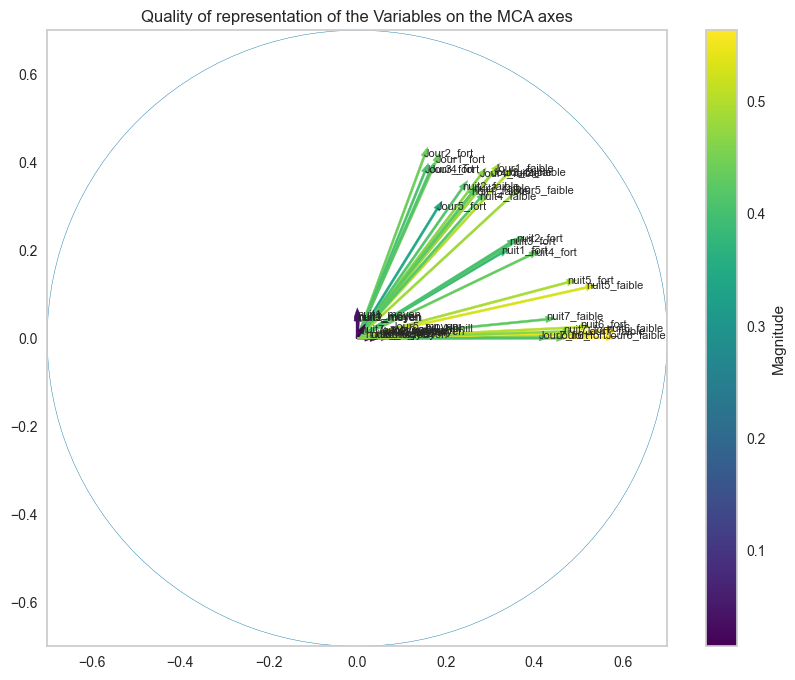

In [ ]:
coord1 = mca.column_cosine_similarities(X_quali)[0]
coord2 = mca.column_cosine_similarities(X_quali)[1]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)

# Calcul de la magnitude des vecteurs
magnitude = np.sqrt(coord1**2 + coord2**2)

# Utilisation d'une colormap pour mapper les valeurs de magnitude à une couleur
norm = plt.Normalize(vmin=magnitude.min(), vmax=magnitude.max())
cmap = plt.cm.viridis  # Tu peux choisir une autre colormap si tu préfères

for i, j, nom, mag in zip(coord1, coord2, labels_lignes, magnitude):
    color = cmap(norm(mag))
    plt.text(i, j, nom, fontsize=8)
    plt.arrow(0, 0, i, j, color=color, width=0.005)
plt.axis((-0.7, 0.7, -0.7, 0.7))

# Cercle
c = plt.Circle((0, 0), radius=0.7, color='b', fill=False)
ax.add_patch(c)

plt.title('Quality of representation of the Variables on the MCA axes')
plt.grid(False)

# Ajouter une barre de couleur
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Magnitude')

plt.show()

## Clustering Kmeans sur la MCA

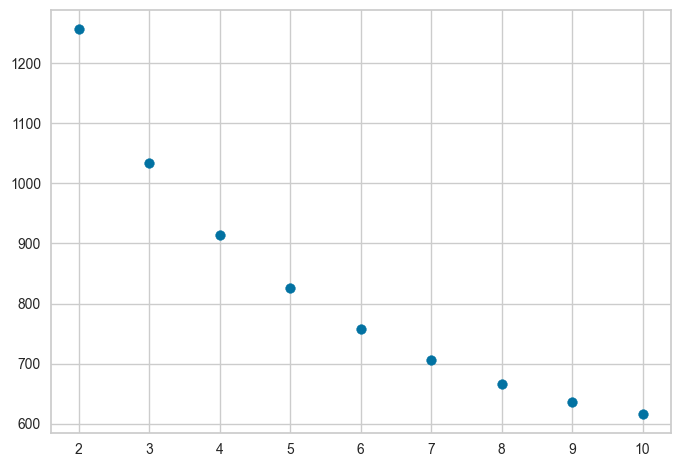

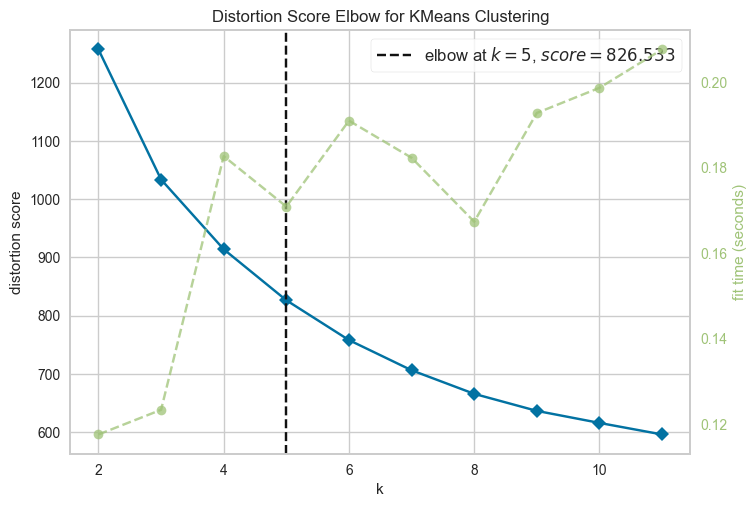

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [405]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    kmeans.fit(velib_mca_reduced)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)

plt.scatter(range(2, 11), inertia[1:])
plt.show()


# --- #


# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(2,12))

visualizer.fit(velib_mca_reduced)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

In [406]:
K = 5
kmeans_mca = KMeans(n_clusters=K, random_state=0)
clusters_kmeans_mca = kmeans_mca.fit_predict(velib_mca_reduced)

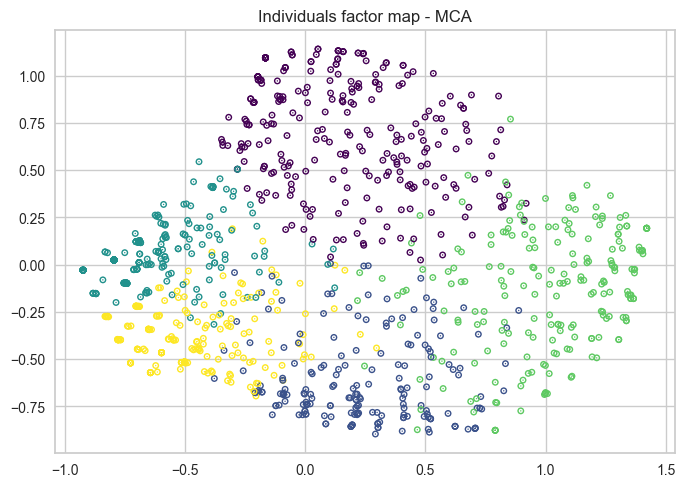

In [407]:
plt.scatter(velib_mca_reduced[0], velib_mca_reduced[1], c=clusters_kmeans_mca, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - MCA")
plt.show()

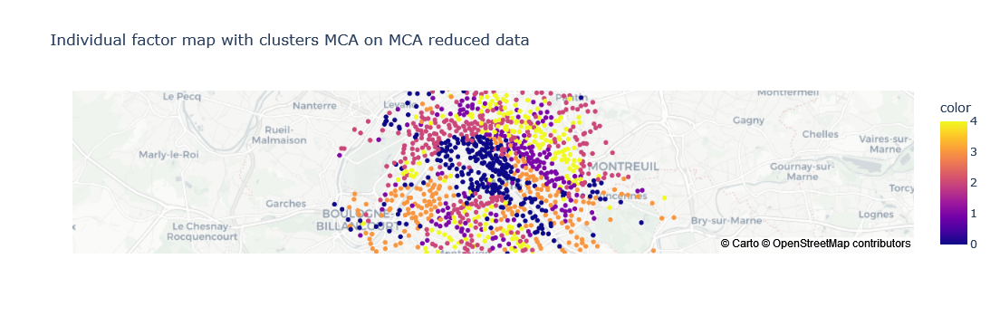

In [408]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmeans_mca.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_kmeans_mca, lat=Position[:,1], lon=Position[:,0], color=clusters_kmeans_mca,
                    color_discrete_sequence=px.colors.qualitative.Set1,
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters MCA on MCA reduced data")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

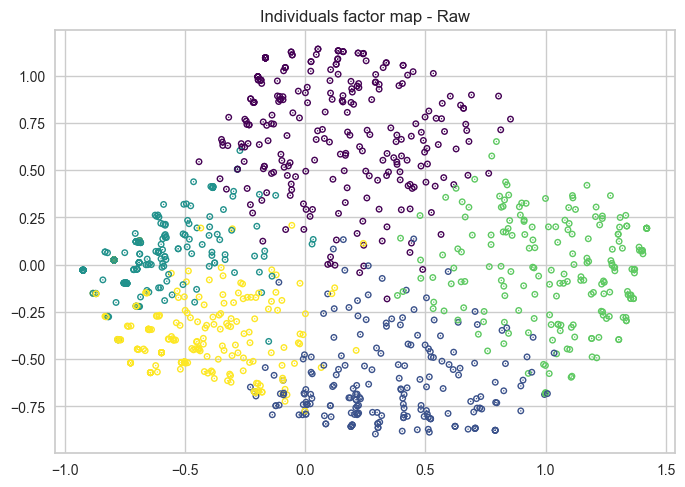

In [409]:
#On fait un clustering Kmeans sur le jeu de données loading complet
K = 5
kmeans_raw = KMeans(n_clusters=K, random_state=0)
clusters_raw = kmeans_raw.fit_predict(loading)

plt.scatter(velib_mca_reduced[0], velib_mca_reduced[1], c=clusters_raw, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - Raw")
plt.show()

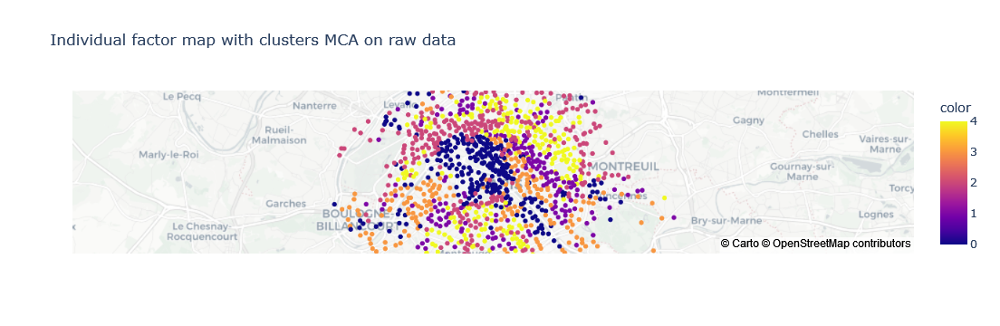

In [410]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_raw.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_raw, lat=Position[:,1], lon=Position[:,0], color=clusters_raw,
                    color_discrete_sequence=px.colors.qualitative.Set1,
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters MCA on raw data")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()


Classes size: [253 144 285 174 165]
Class (in the classif1 numbering): [0 1 2 3 4]



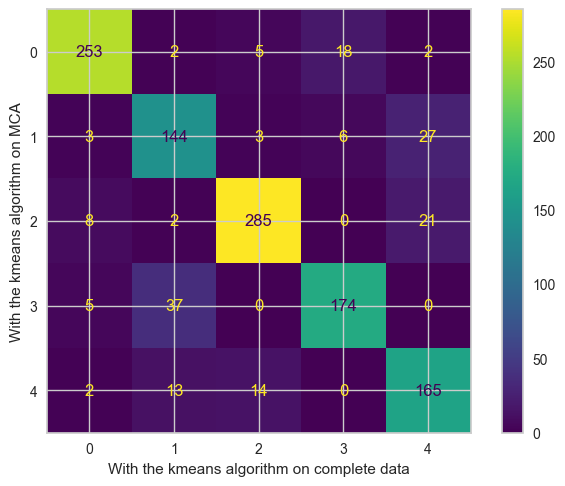

In [418]:
cm_mca, clusters_kmean_raw_sorted = matchClasses(clusters_kmeans_mca, clusters_raw)

ConfusionMatrixDisplay(cm_mca).plot()
plt.xlabel('With the kmeans algorithm on complete data')
plt.ylabel('With the kmeans algorithm on MCA')

plt.show()

In [412]:
print(cm_mca)
# convert numpy array to dataframe
df_cm_mca = pd.DataFrame(cm_mca, columns =['gr0', 'gr1', 'gr2', 'gr3', 'gr4'])
print("\nPandas DataFrame: ")
df_cm_mca

[[253   2   5  18   2]
 [  3 144   3   6  27]
 [  8   2 285   0  21]
 [  5  37   0 174   0]
 [  2  13  14   0 165]]

Pandas DataFrame: 


,gr0,gr1,gr2,gr3,gr4
0,253,2,5,18,2
1,3,144,3,6,27
2,8,2,285,0,21
3,5,37,0,174,0
4,2,13,14,0,165


In [413]:
ca_mca = prince.CA(
    n_components=15,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
ca_mca = ca_mca.fit(df_cm_mca)

In [414]:
ca_mca.row_contributions_.style.format('{:.0%}')

,0,1,2,3
0,29%,43%,5%,0%
1,0%,21%,4%,59%
2,45%,9%,18%,1%
3,18%,20%,30%,14%
4,8%,6%,42%,27%


In [415]:
ca_mca.column_contributions_.style.format('{:.0%}')

,0,1,2,3
gr0,27%,44%,6%,0%
gr1,1%,24%,2%,56%
gr2,45%,9%,19%,1%
gr3,18%,15%,30%,19%
gr4,9%,7%,43%,23%


In [416]:
ca_mca.row_cosine_similarities(df_cm_mca)

,0,1,2,3
0,0.401511,0.545943,0.051341,0.001205
1,0.006077,0.381092,0.064484,0.548347
2,0.667275,0.129400,0.197880,0.005444
3,0.272666,0.287131,0.340770,0.099433
4,0.141701,0.102251,0.534757,0.221291


In [417]:
ca_mca.column_cosine_similarities(df_cm_mca)

,0,1,2,3
gr0,0.374895,0.563498,0.059063,0.002544
gr1,0.021578,0.433098,0.024172,0.521151
gr2,0.660364,0.127623,0.205644,0.006369
gr3,0.287762,0.216022,0.350755,0.145461
gr4,0.150606,0.113651,0.546063,0.189681
